In [ ]:
import random
import networkx as nx
import matplotlib.pyplot as plt

In [ ]:
G = nx.watts_strogatz_graph(n = 10, k = 2, p = 0.45)
pos = nx.circular_layout(G)

plt.figure(figsize = (12, 12))
nx.draw_networkx(G, pos)

In [ ]:
list_of_diameters = [nx.diameter(G)]
list_of_nodes = [G.number_of_nodes()]

for _ in range(123-10):
    nodes_ = list(G.nodes())
    G_copy = G.copy()
    new_node = nodes_[-1] + 1
    G_copy.add_node(new_node)
    G_copy.add_edge(random.choice(nodes_), new_node)
    while nx.diameter(G_copy) <= 5 or nx.diameter(G_copy) >= 7:
        G_copy = G.copy()
        new_node = nodes_[-1] + 1
        G_copy.add_node(new_node)
        G_copy.add_edge(random.choice(nodes_), new_node)
    G = G_copy
    pos = nx.circular_layout(G)
    
    list_of_diameters.append(nx.diameter(G)) 
    list_of_nodes.append(G.number_of_nodes())

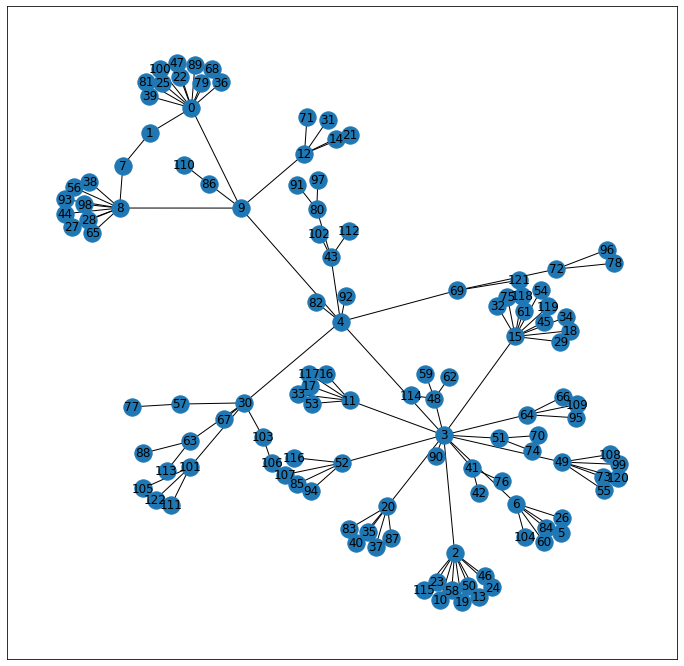

In [ ]:
pos = nx.spring_layout(G)
plt.figure(figsize = (12, 12))
nx.draw_networkx(G, pos)

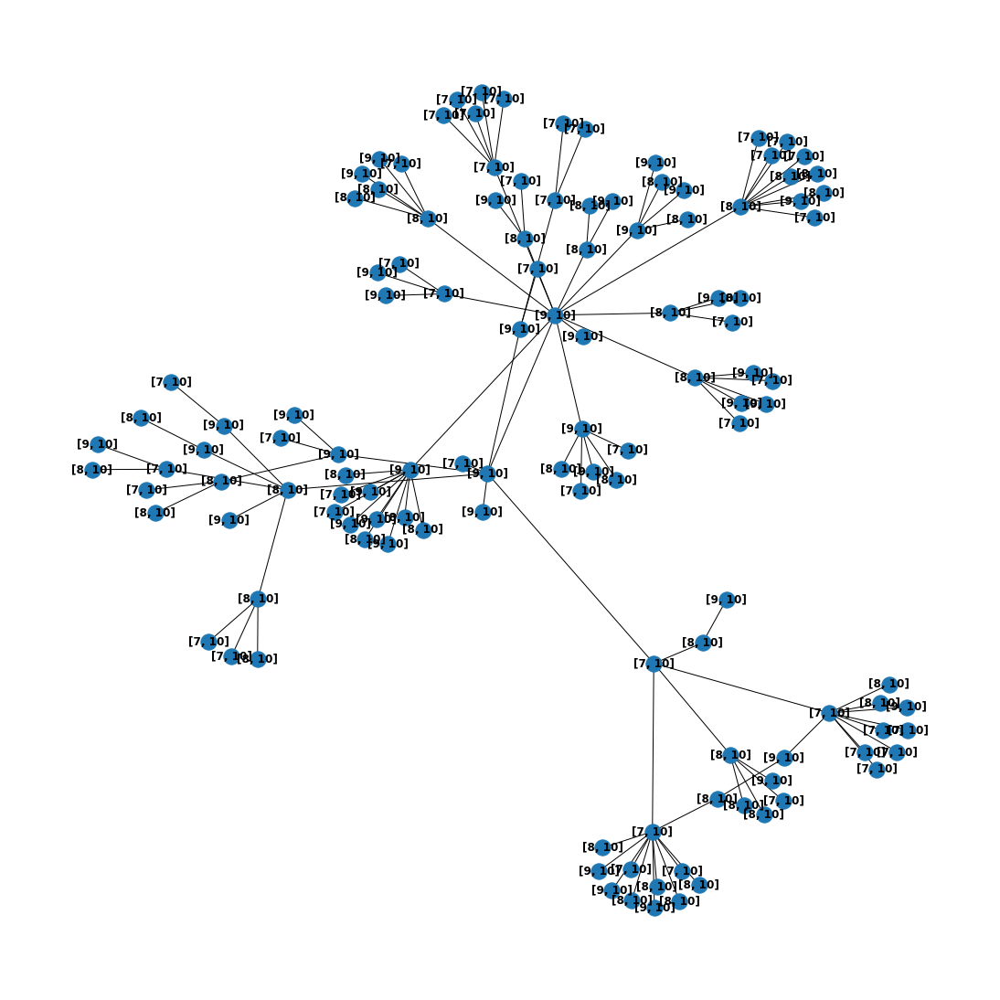

In [ ]:
for i in range(G.number_of_nodes()):
    now_w=10
    max_w=1
    while(now_w>=max_w):
        now_w = random.randint(7, 9)
        max_w = 10
    G.nodes[i]['loads'] = [now_w,max_w]

values = []
for i in range(G.number_of_nodes()):
    values.append(dict(G.nodes.data())[i]['loads'])
labels = dict(zip(list(dict(G.nodes.data()).keys()),values))

plt.figure(figsize=(15,15)) 
nx.draw(G, with_labels=True,labels = labels, font_weight='bold')
plt.show()

In [ ]:
class functions:
  def draw_graph(self,nodelist,color_highlighted,color_basic):
      pos = nx.circular_layout(G)
      plt.figure(figsize=(13,13)) 

      nx.draw_networkx_nodes(
          G, pos, node_size=123, nodelist=set(G.nodes)-set(nodelist), node_color=f"tab:{color_basic}"
      )
      nx.draw_networkx_nodes(
          G, pos, node_size=123, nodelist=nodelist, node_color=f"tab:{color_highlighted}"
      )
      nx.draw_networkx_edges(G, pos, alpha=0.5, width=1)
      nx.draw_networkx_labels(G, pos, labels, font_size=13,font_weight='bold')
      plt.show()
    
  def added_loads(self,overloaded_node):  
    vertexes_to_add_additional_load_to = 55
    if len(G.edges(overloaded_node)) > 0:
        additional_load = round(labels[overloaded_node][0]/len(G.edges(overloaded_node)))

        vertexes_to_add_additional_load_to = []
        for vertex in range(len(list(G.edges(overloaded_node)))):
            vertexes_to_add_additional_load_to.append(list(G.edges(overloaded_node))[vertex][1])

        try:
            for vertex in vertexes_to_add_additional_load_to:
                labels[vertex][0] = labels[vertex][0] + additional_load
        except KeyError:
            pass
        
    G.remove_node(overloaded_node)
    labels.pop(overloaded_node,'not found')
    
    if vertexes_to_add_additional_load_to != 55:
        self.draw_graph(vertexes_to_add_additional_load_to, 'red', 'blue')
    return vertexes_to_add_additional_load_to

  def check_graph(self,nodes_with_added_load,labels):
    new_list_nodes_for_add_load = []
    try:
        for node in nodes_with_added_load:
            try:
                if labels[node][0] >= labels[node][1]:
                    new_list_nodes_for_add_load.append(node)
            except KeyError:
                pass
    except TypeError:
        node = nodes_with_added_load
        try:
            if labels[node][0] >= labels[node][1]:
                new_list_nodes_for_add_load.append(node)
        except KeyError:
            pass
    return new_list_nodes_for_add_load  



f = functions()

In [ ]:
list_of_nodes = [G.number_of_nodes()]

iter_num = 1
while G.number_of_nodes() > 1:
    print(f'Итерация (время) {iter_num}')
    start_node = int(random.choice(list(G.nodes)))
    print(f'Стартовая вершина: {start_node} \n')
    f.draw_graph([start_node], 'red', 'blue')

    labels[start_node][0] = random.randint(labels[start_node][1],20)

    vertexes_to_add_additional_load_to = f.added_loads(start_node)
    
    list_of_nodes.append(G.number_of_nodes())
    
    for _ in range(2, 50):
        iter_num += 1
        print(f'Итерация №{iter_num}')
        new_overloaded_nodes = f.check_graph(vertexes_to_add_additional_load_to, labels)
        new_overloaded_nodes = list(set(new_overloaded_nodes))
        if not new_overloaded_nodes:
            donee = 1
            break
        vertexes_to_add_additional_load_to = []
        for node in list(new_overloaded_nodes):
            res = f.added_loads(node)
            if res != 55:
                vertexes_to_add_additional_load_to += res
        list_of_nodes.append(G.number_of_nodes())

            
print('Количество итераций: ', iter_num)

In [ ]:
y2 = list_of_nodes
n = 0
for i in range (len(y2)):
    n += 1
    print(f'Количество вершин: {y2[i]} Итерация (время): {n}')

Количество вершин: 123 Итерация (время): 1
Количество вершин: 122 Итерация (время): 2
Количество вершин: 119 Итерация (время): 3
Количество вершин: 118 Итерация (время): 4
Количество вершин: 114 Итерация (время): 5
Количество вершин: 109 Итерация (время): 6
Количество вершин: 100 Итерация (время): 7
Количество вершин: 88 Итерация (время): 8
Количество вершин: 66 Итерация (время): 9
Количество вершин: 65 Итерация (время): 10
Количество вершин: 64 Итерация (время): 11
Количество вершин: 63 Итерация (время): 12
Количество вершин: 62 Итерация (время): 13
Количество вершин: 61 Итерация (время): 14
Количество вершин: 57 Итерация (время): 15
Количество вершин: 56 Итерация (время): 16
Количество вершин: 55 Итерация (время): 17
Количество вершин: 47 Итерация (время): 18
Количество вершин: 46 Итерация (время): 19
Количество вершин: 45 Итерация (время): 20
Количество вершин: 41 Итерация (время): 21
Количество вершин: 40 Итерация (время): 22
Количество вершин: 39 Итерация (время): 23
Количество ве

Пробуем взять сразу 123 вершин


In [ ]:
G = nx.watts_strogatz_graph(n = 10, k = 2, p = 0.45)
pos = nx.circular_layout(G)

list_of_diameters = [nx.diameter(G)]
list_of_nodes = [G.number_of_nodes()]

for _ in range(123):
    nodes_ = list(G.nodes())
    G_copy = G.copy()
    new_node = nodes_[-1] + 1
    G_copy.add_node(new_node)
    G_copy.add_edge(random.choice(nodes_), new_node)
    while nx.diameter(G_copy) <= 5 or nx.diameter(G_copy) >= 7:
        G_copy = G.copy()
        new_node = nodes_[-1] + 1
        G_copy.add_node(new_node)
        G_copy.add_edge(random.choice(nodes_), new_node)
    G = G_copy
    pos = nx.circular_layout(G)
    
    list_of_diameters.append(nx.diameter(G)) 
    list_of_nodes.append(G.number_of_nodes())

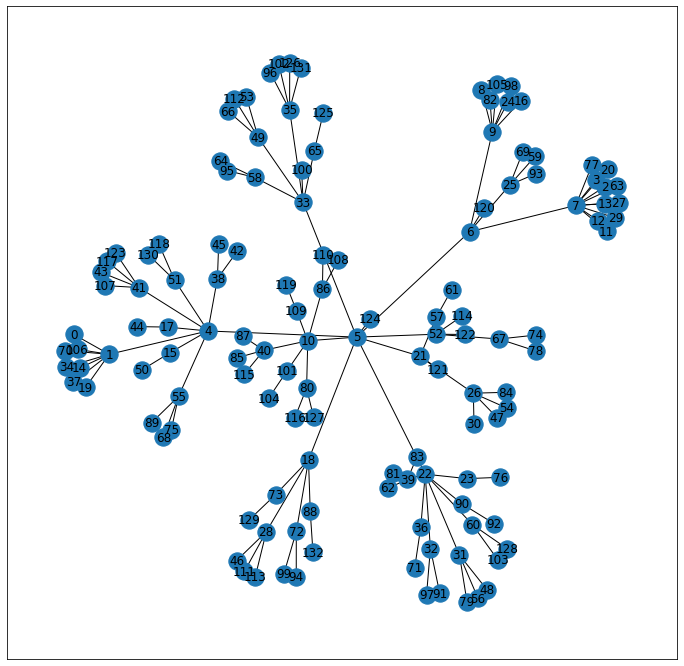

In [ ]:
pos = nx.spring_layout(G)
plt.figure(figsize = (12, 12))
nx.draw_networkx(G, pos)

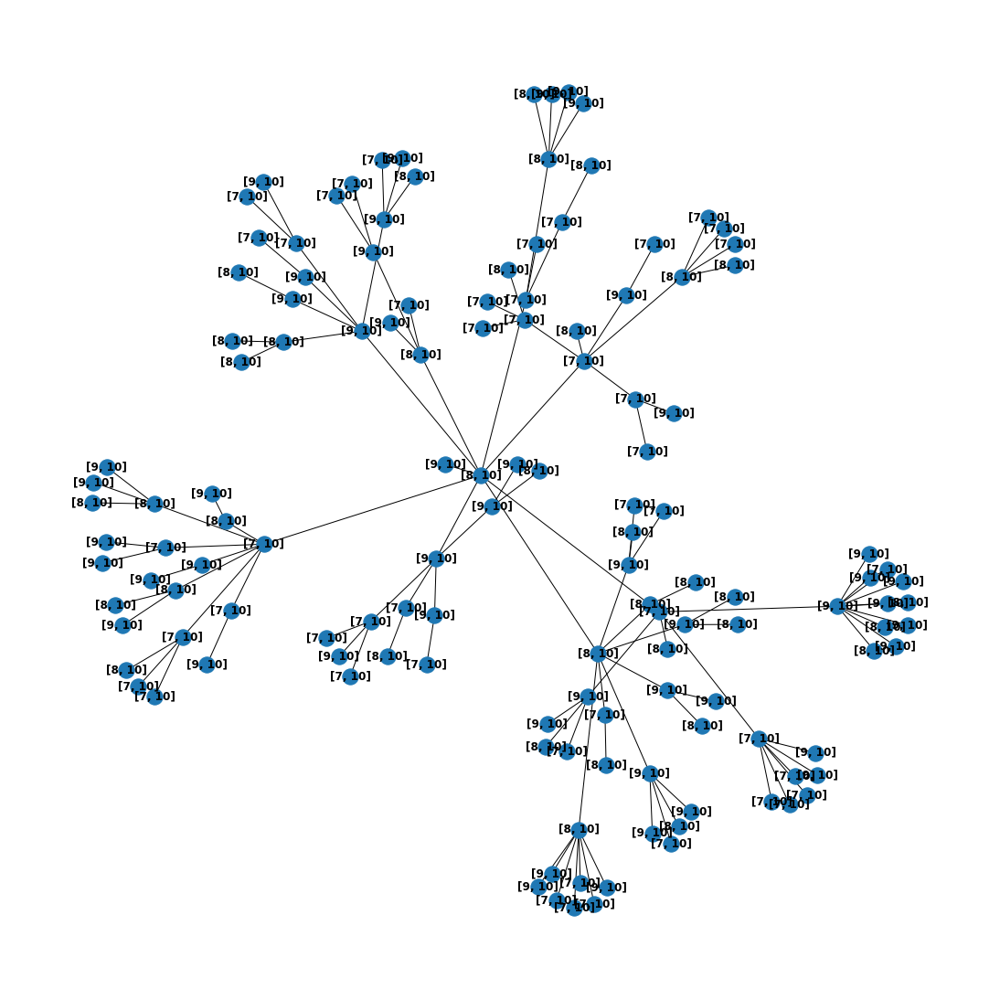

In [ ]:
for i in range(G.number_of_nodes()):
    now_w=10
    max_w=1
    while(now_w>=max_w):
        now_w = random.randint(7, 9)
        max_w = 10
    G.nodes[i]['loads'] = [now_w,max_w]

values = []
for i in range(G.number_of_nodes()):
    values.append(dict(G.nodes.data())[i]['loads'])
labels = dict(zip(list(dict(G.nodes.data()).keys()),values))

plt.figure(figsize=(15,15)) 
nx.draw(G, with_labels=True,labels = labels, font_weight='bold')
plt.show()

In [ ]:
class functions:
  def draw_graph(self,nodelist,color_highlighted,color_basic):
      pos = nx.circular_layout(G)
      plt.figure(figsize=(13,13)) 

      nx.draw_networkx_nodes(
          G, pos, node_size=123, nodelist=set(G.nodes)-set(nodelist), node_color=f"tab:{color_basic}"
      )
      nx.draw_networkx_nodes(
          G, pos, node_size=123, nodelist=nodelist, node_color=f"tab:{color_highlighted}"
      )
      nx.draw_networkx_edges(G, pos, alpha=0.5, width=1)
      nx.draw_networkx_labels(G, pos, labels, font_size=13,font_weight='bold')
      plt.show()
    
  def added_loads(self,overloaded_node):  
    vertexes_to_add_additional_load_to = 55
    if len(G.edges(overloaded_node)) > 0:
        additional_load = round(labels[overloaded_node][0]/len(G.edges(overloaded_node)))

        vertexes_to_add_additional_load_to = []
        for vertex in range(len(list(G.edges(overloaded_node)))):
            vertexes_to_add_additional_load_to.append(list(G.edges(overloaded_node))[vertex][1])

        try:
            for vertex in vertexes_to_add_additional_load_to:
                labels[vertex][0] = labels[vertex][0] + additional_load
        except KeyError:
            pass
        
    G.remove_node(overloaded_node)
    labels.pop(overloaded_node,'not found')
    
    if vertexes_to_add_additional_load_to != 55:
        self.draw_graph(vertexes_to_add_additional_load_to, 'red', 'blue')
    return vertexes_to_add_additional_load_to

  def check_graph(self,nodes_with_added_load,labels):
    new_list_nodes_for_add_load = []
    try:
        for node in nodes_with_added_load:
            try:
                if labels[node][0] >= labels[node][1]:
                    new_list_nodes_for_add_load.append(node)
            except KeyError:
                pass
    except TypeError:
        node = nodes_with_added_load
        try:
            if labels[node][0] >= labels[node][1]:
                new_list_nodes_for_add_load.append(node)
        except KeyError:
            pass
    return new_list_nodes_for_add_load  



f = functions()

Итерация (время) 1
Стартовая вершина: 33 



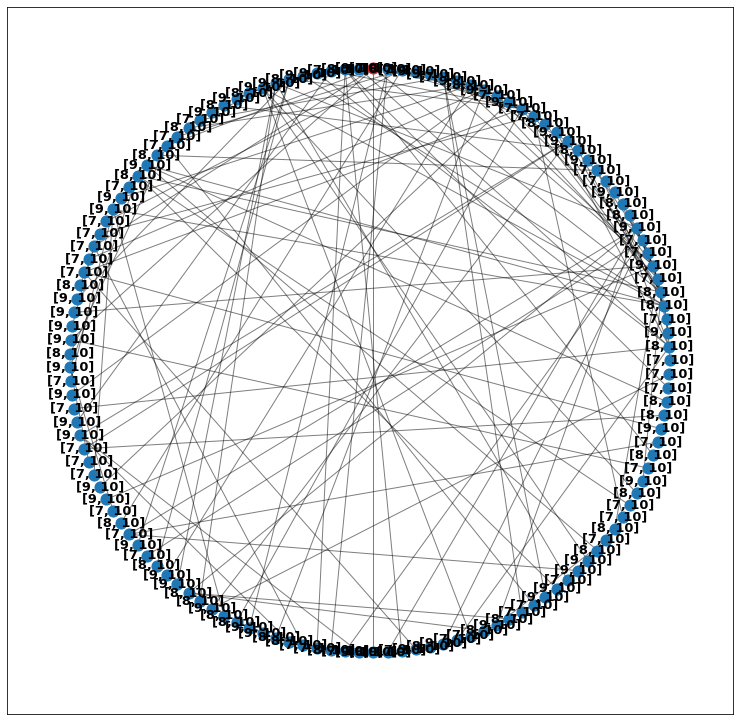

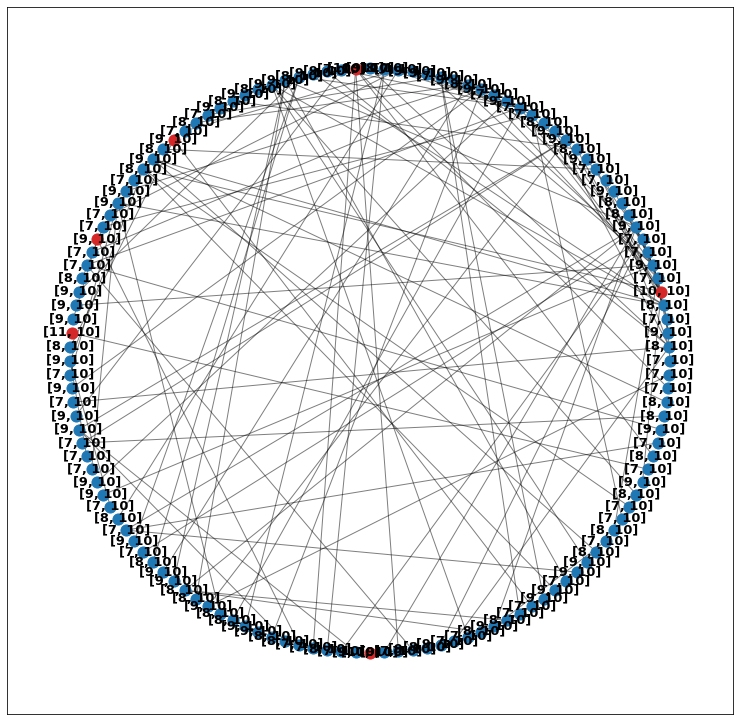

Итерация №2


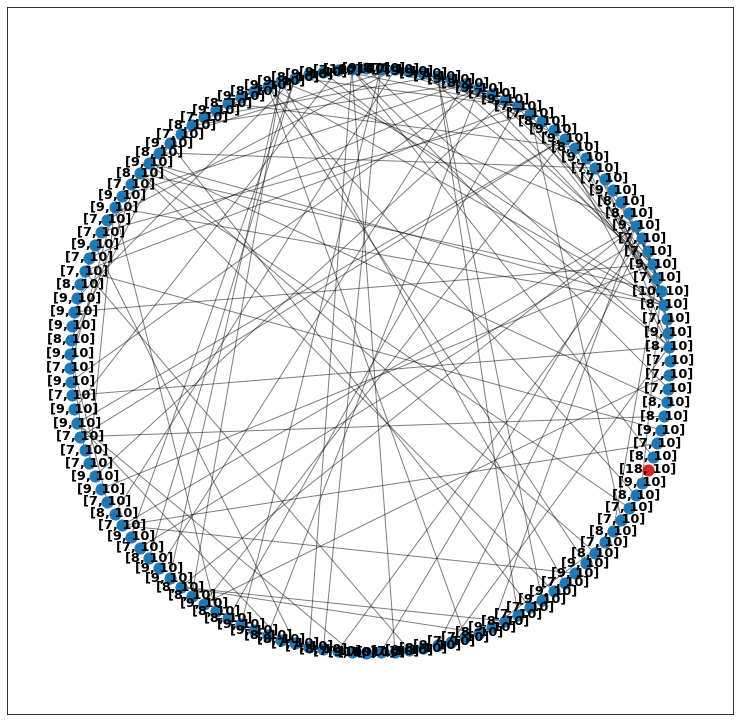

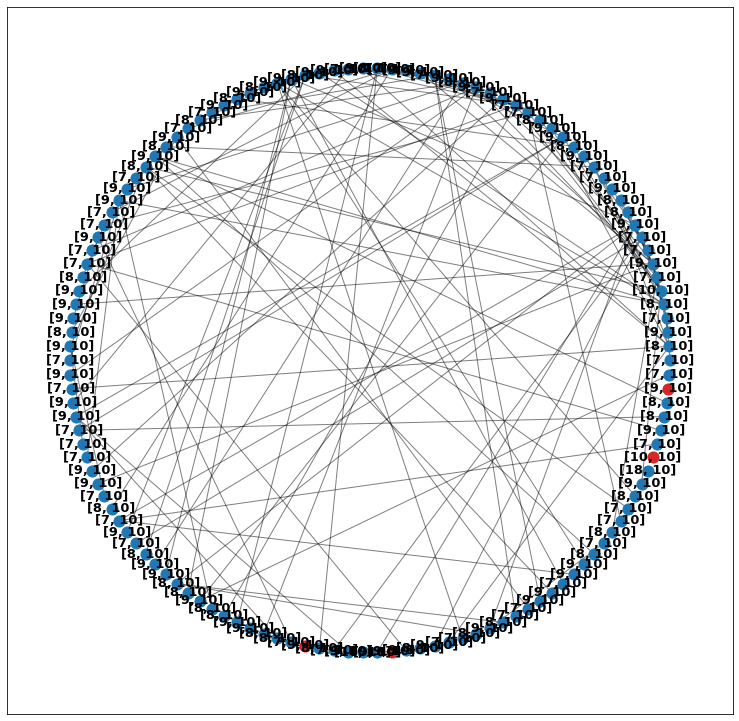

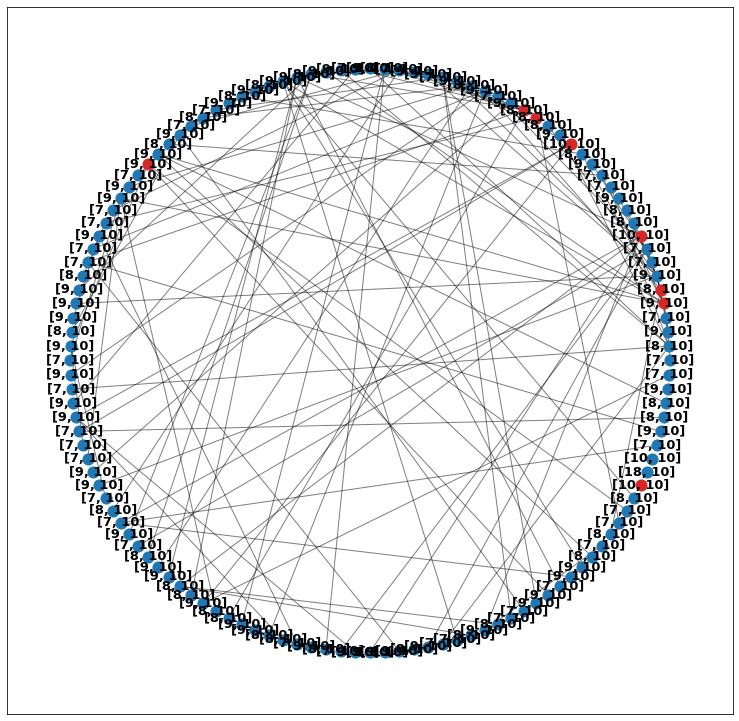

Итерация №3


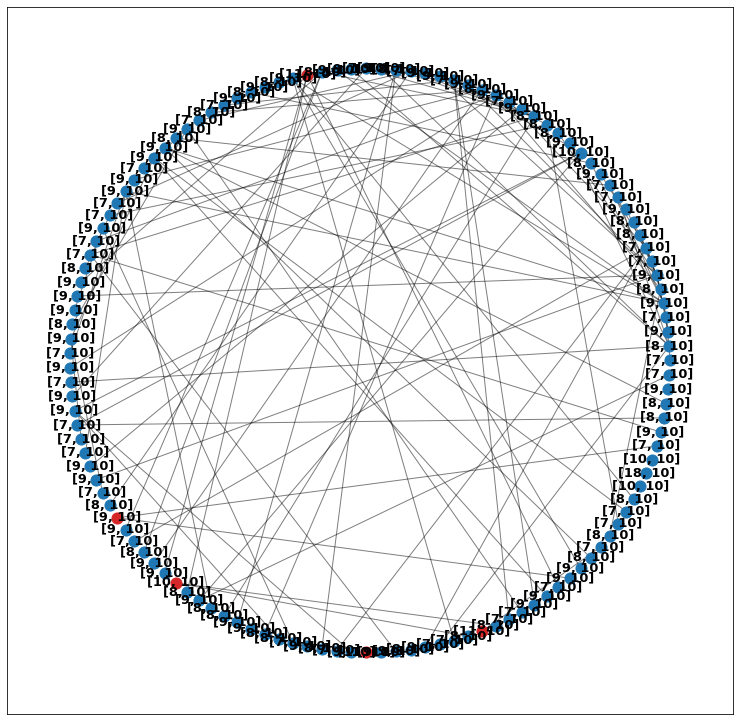

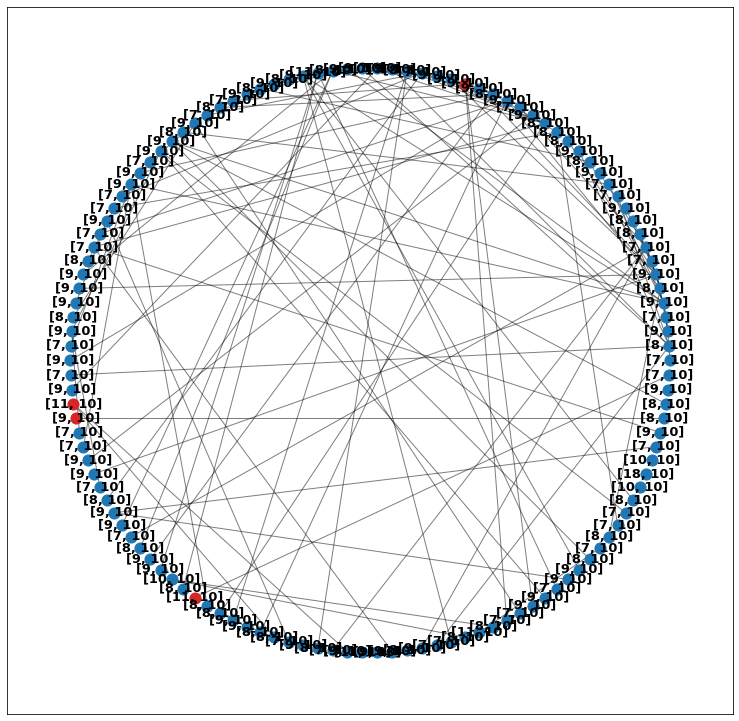

Итерация №4


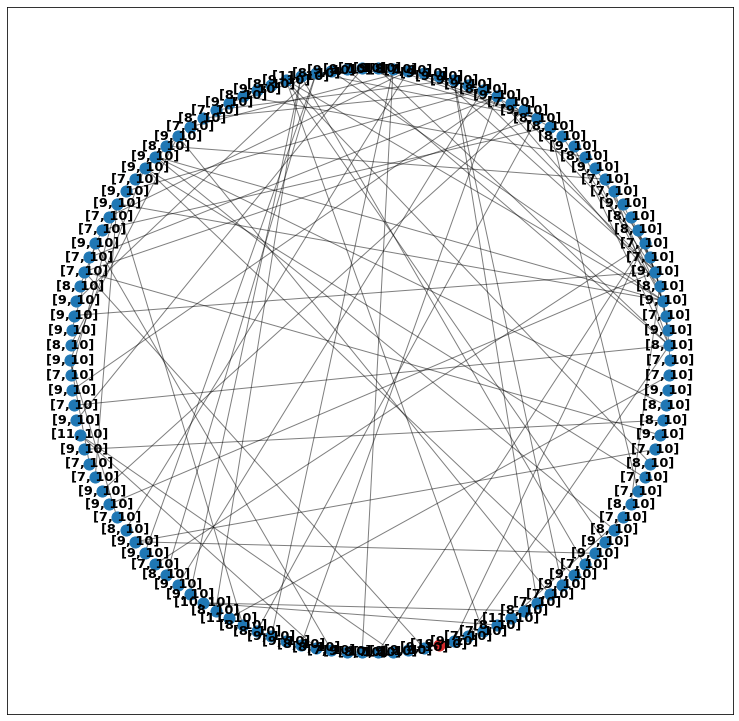

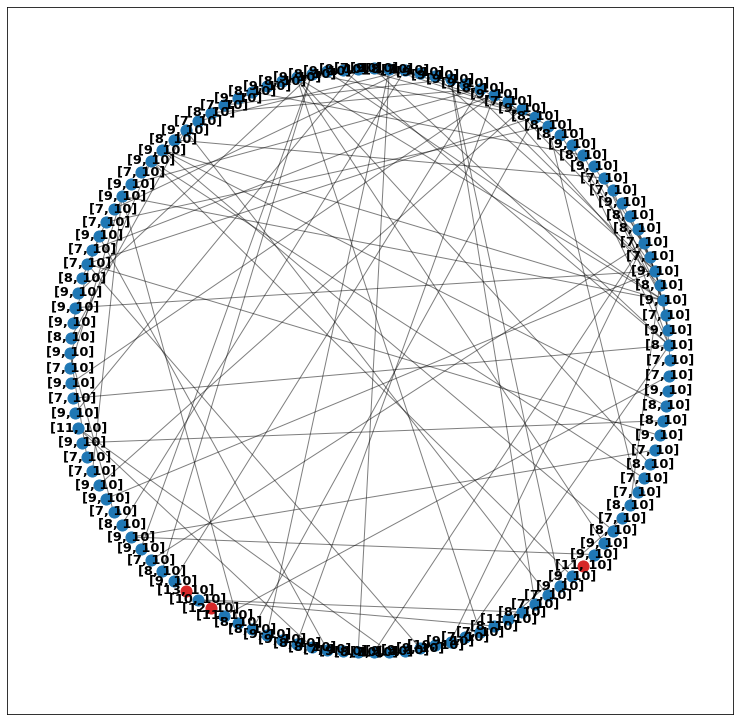

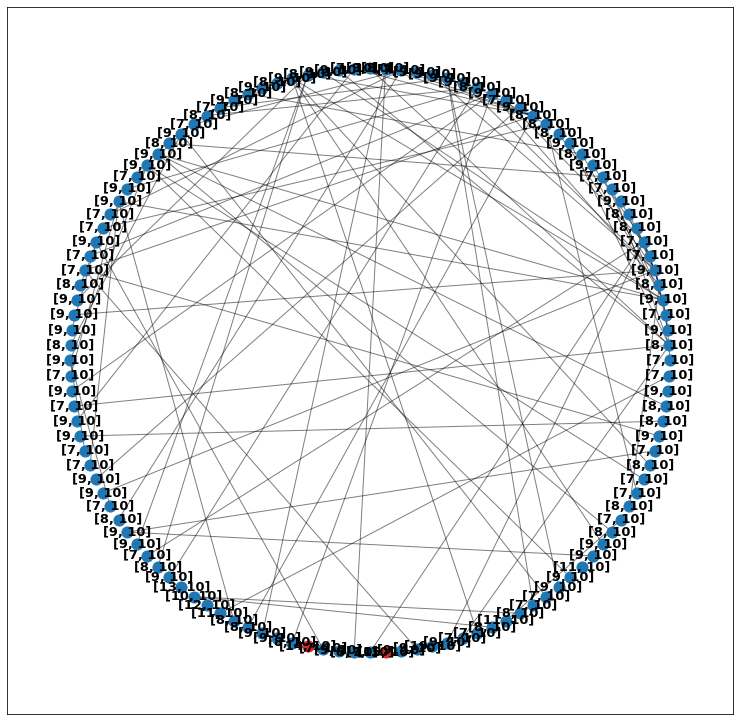

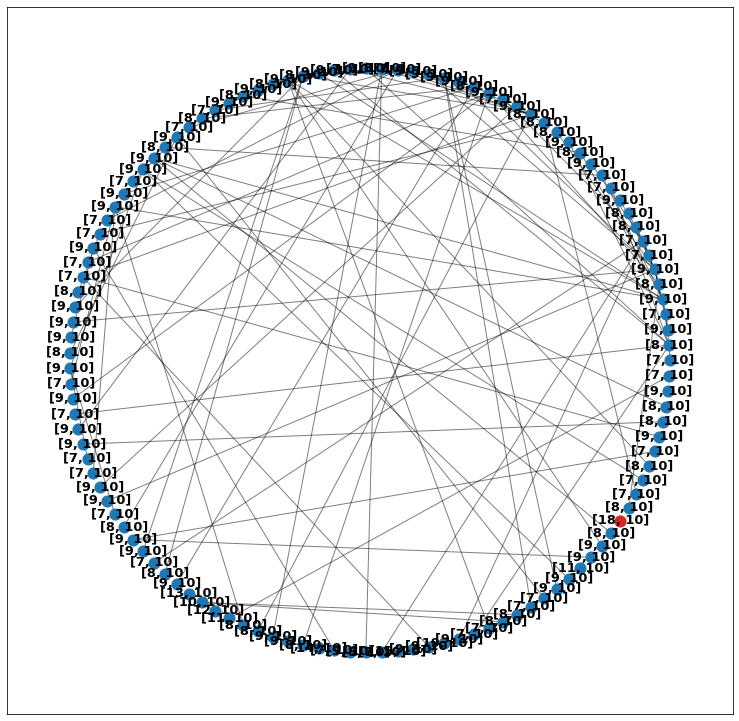

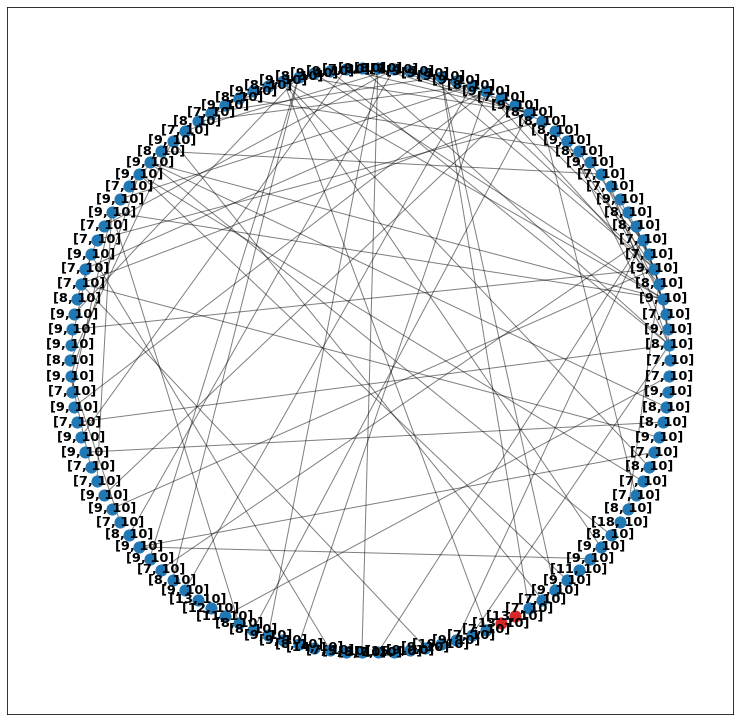

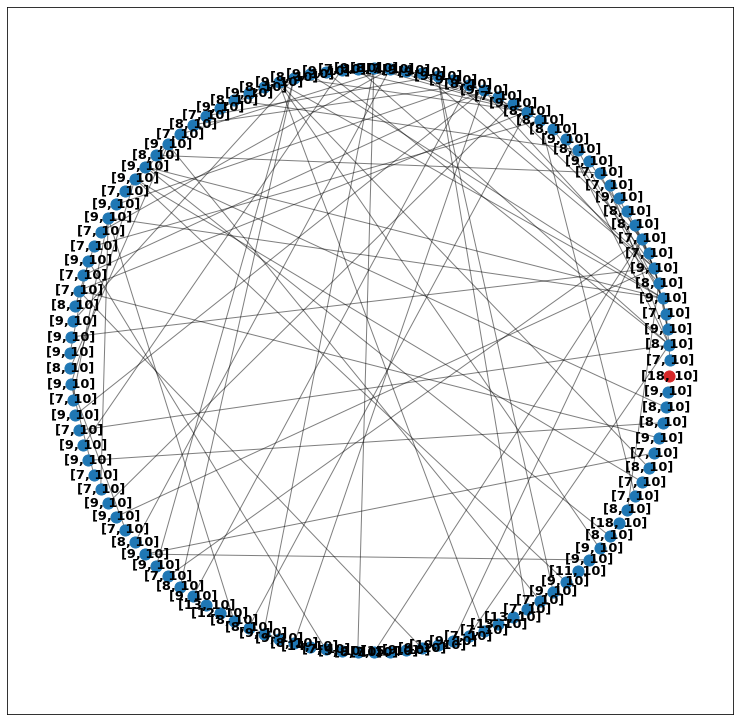

Итерация №5
Итерация №6
Итерация (время) 6
Стартовая вершина: 71 



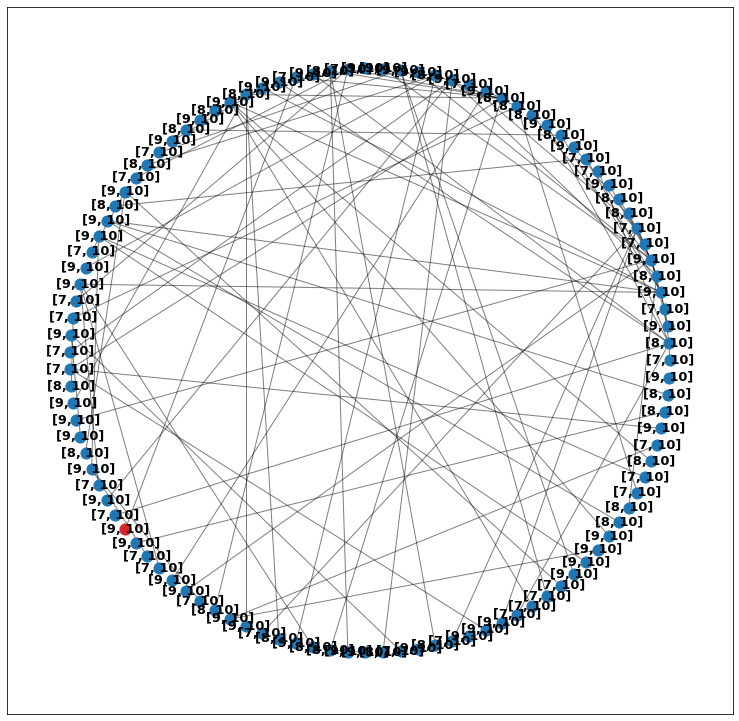

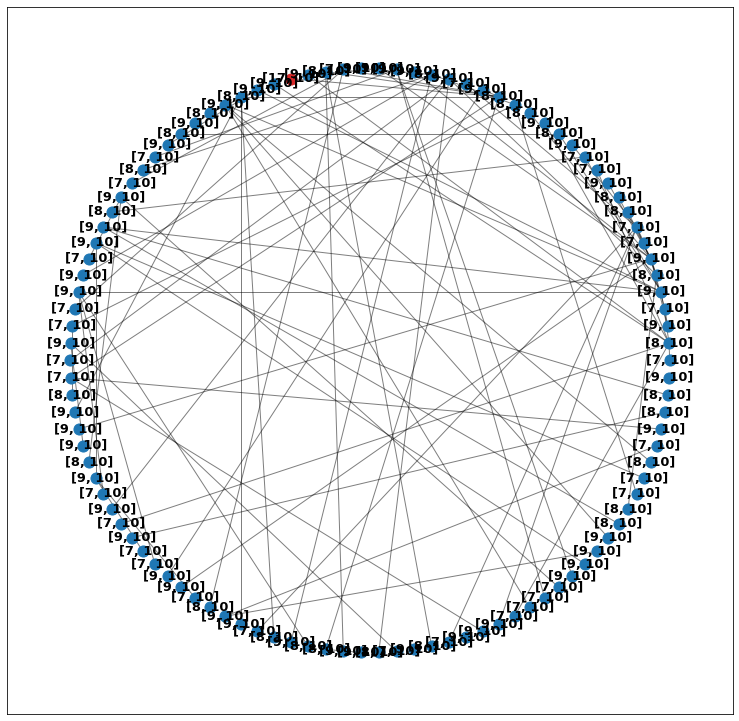

Итерация №7


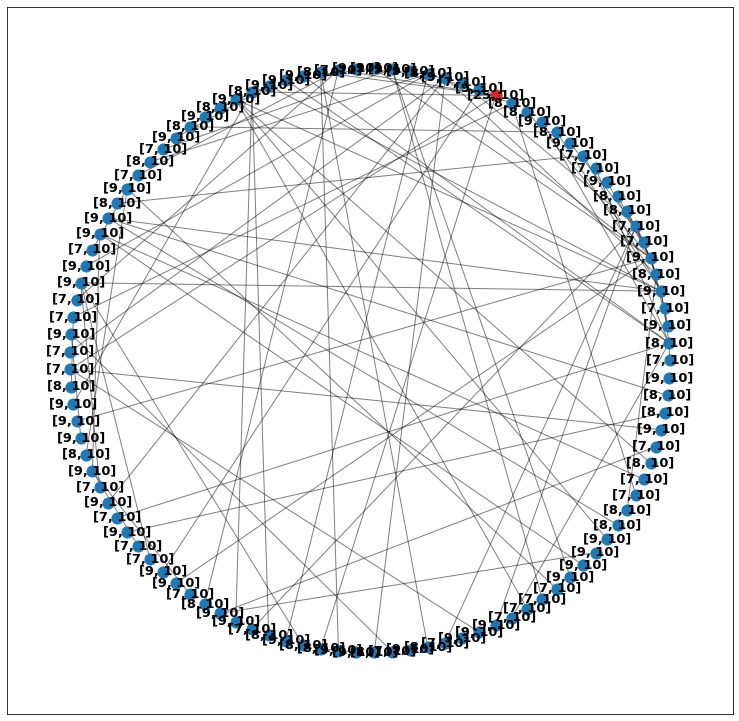

Итерация №8


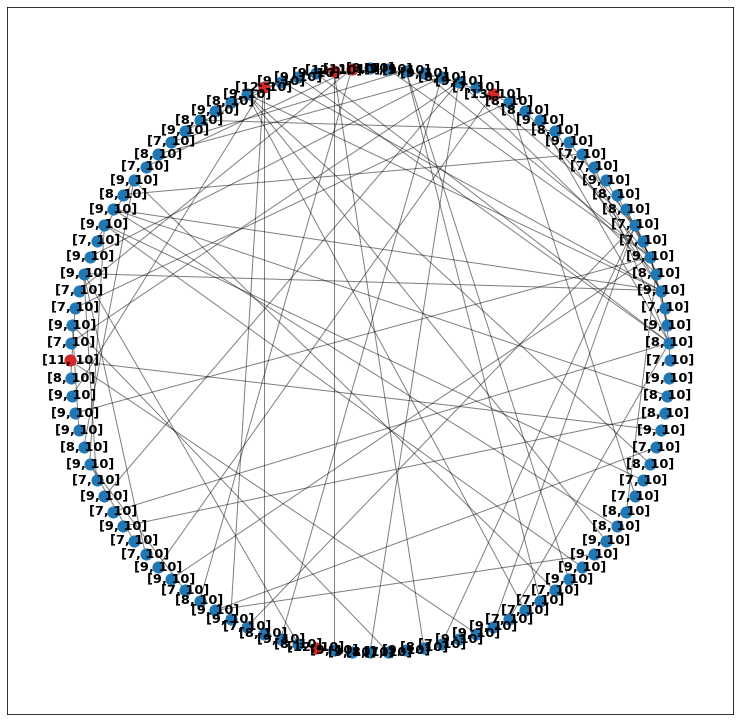

Итерация №9


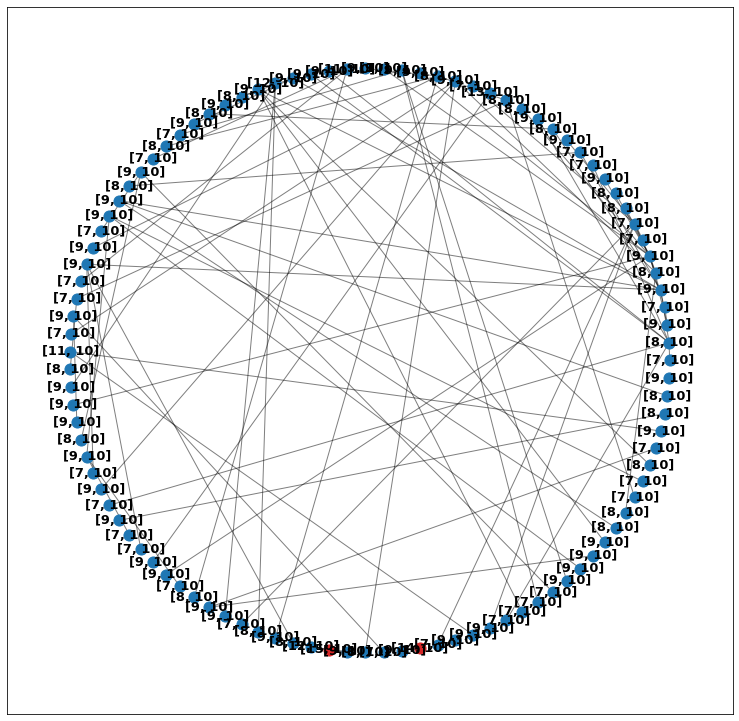

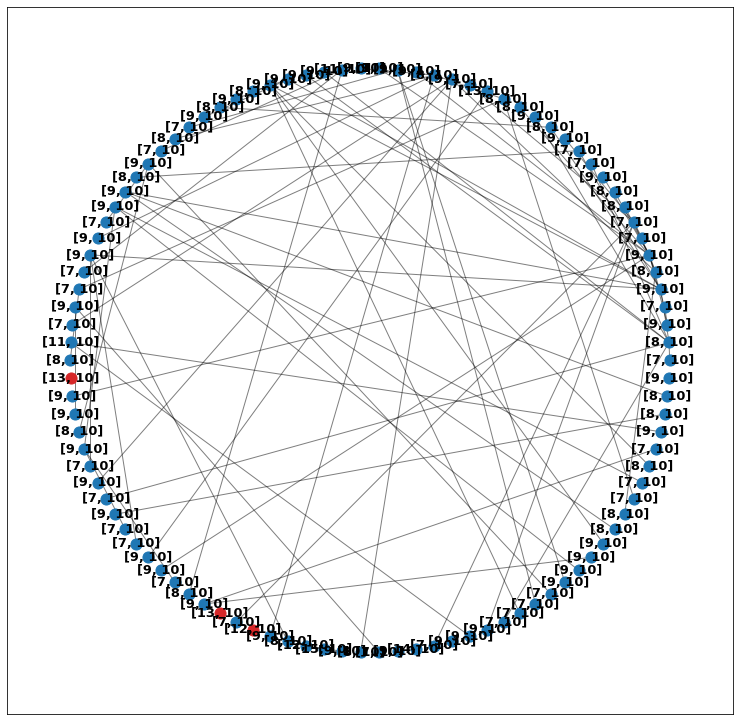

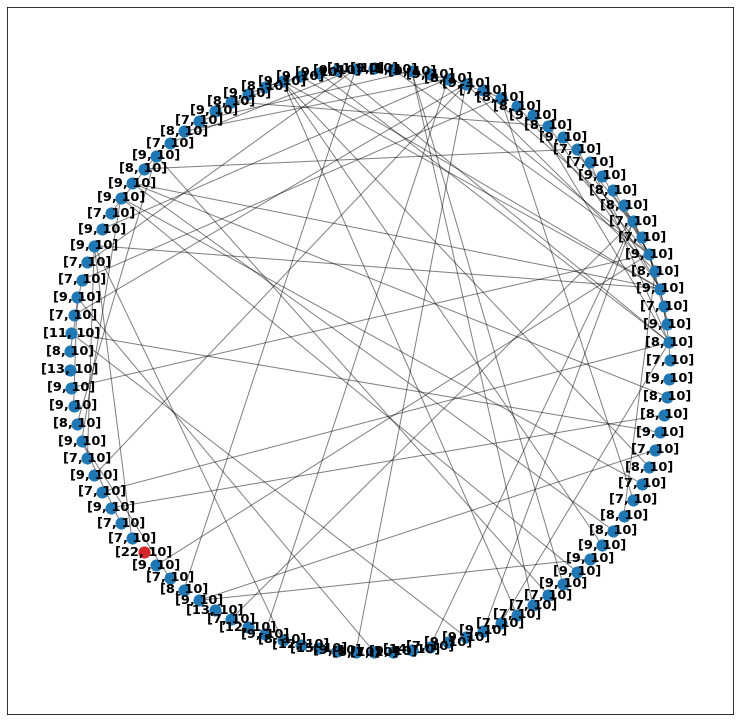

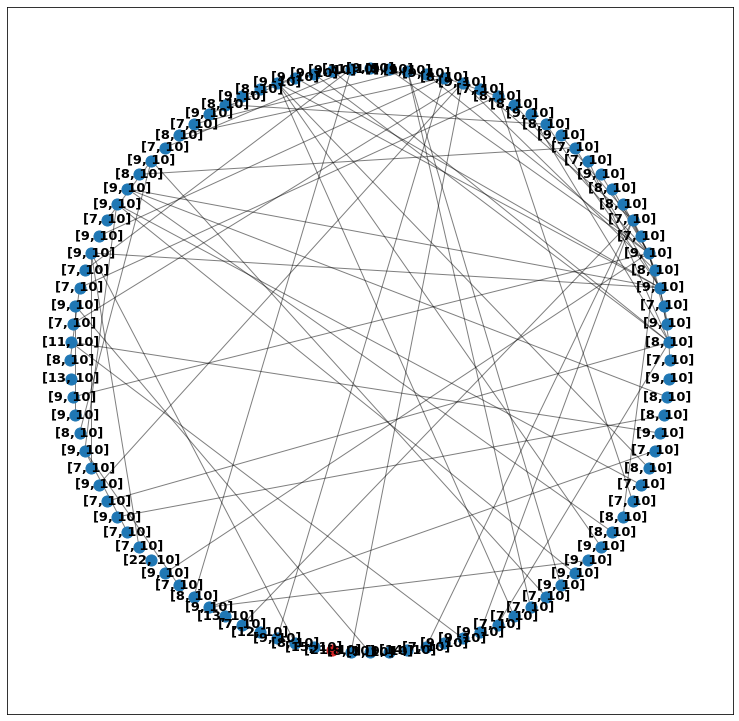

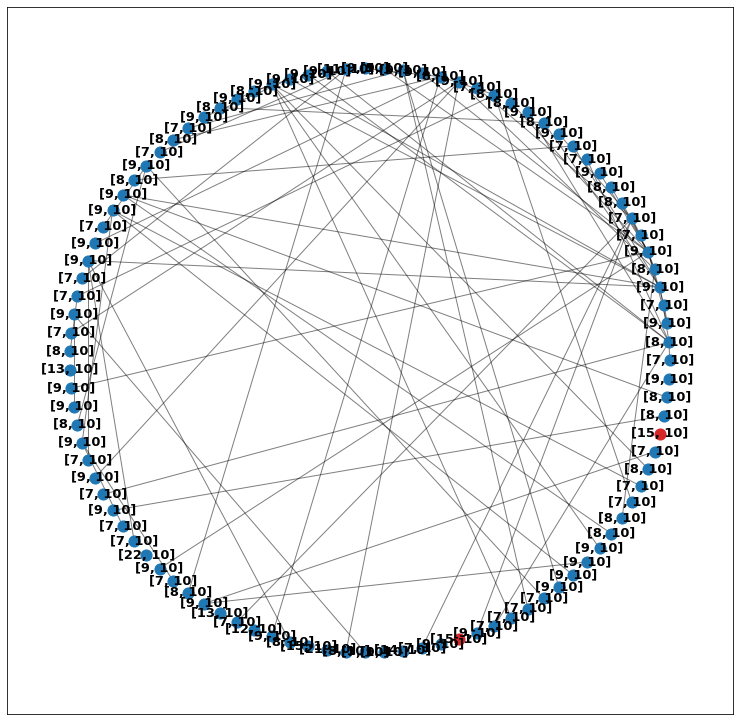

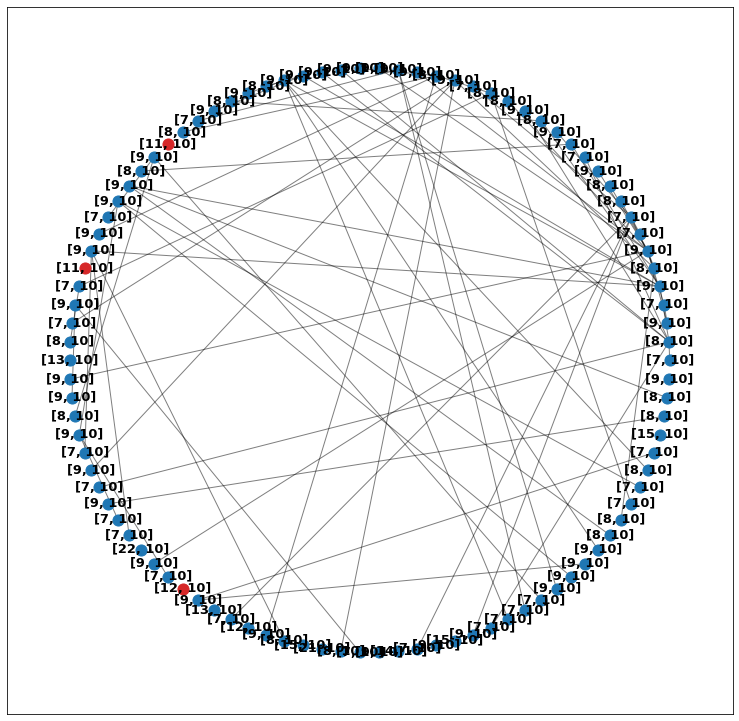

Итерация №10
Итерация №11
Итерация (время) 11
Стартовая вершина: 67 



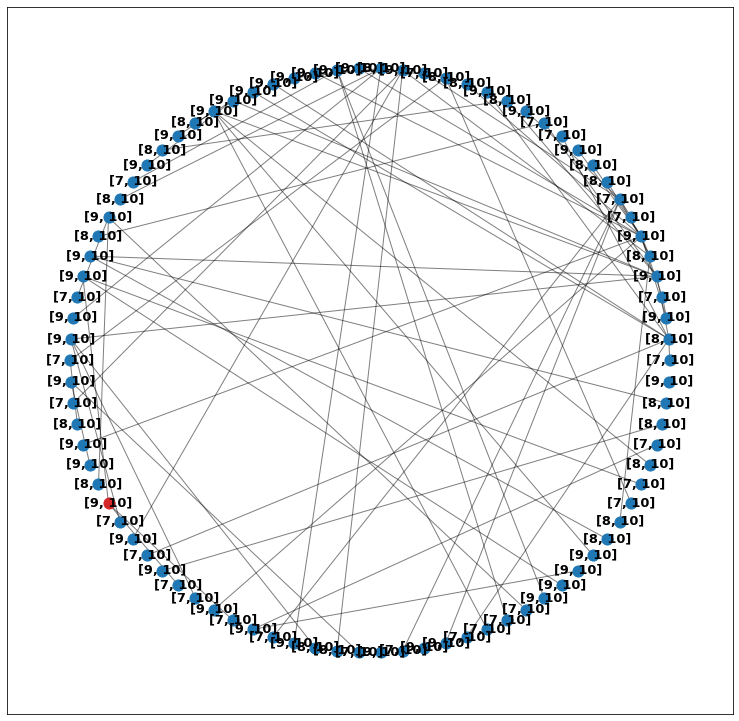

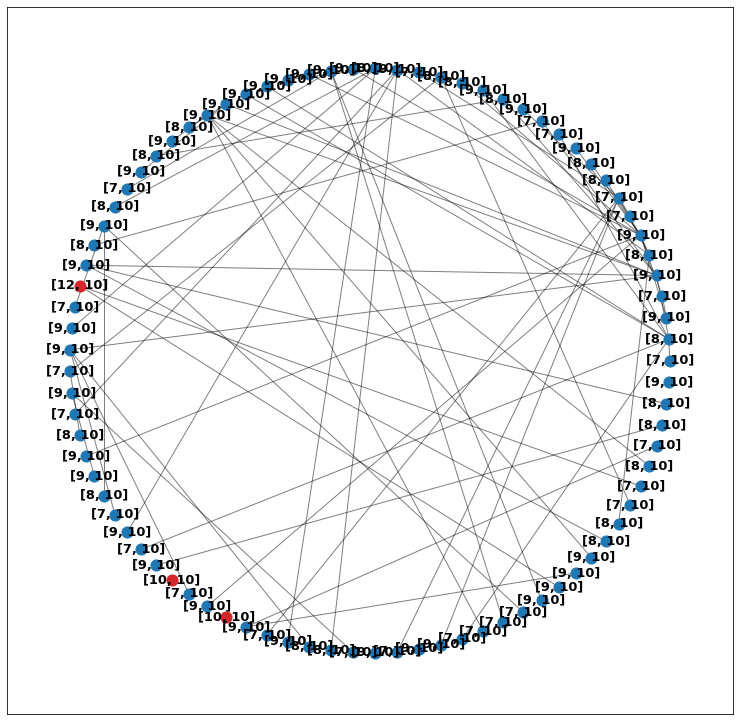

Итерация №12


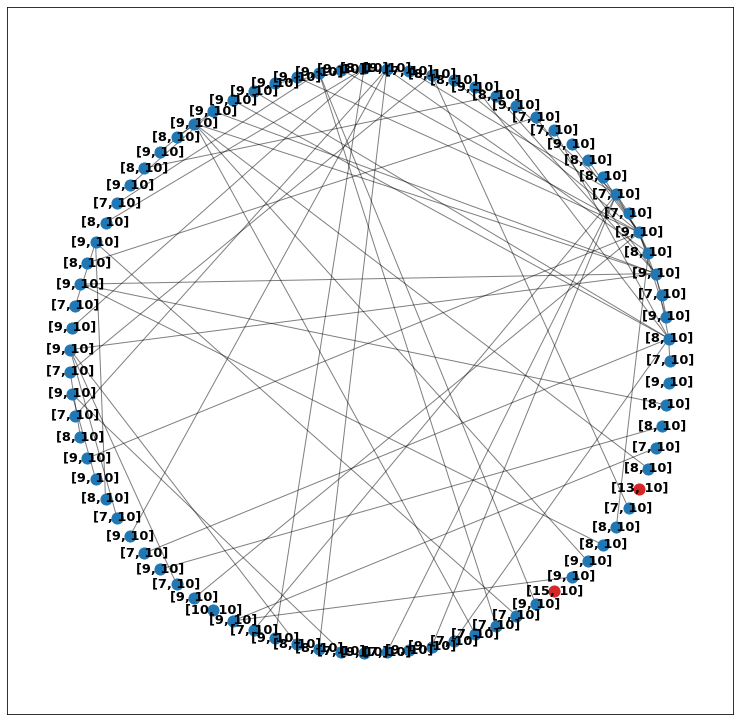

Итерация №13
Итерация №14
Итерация (время) 14
Стартовая вершина: 95 



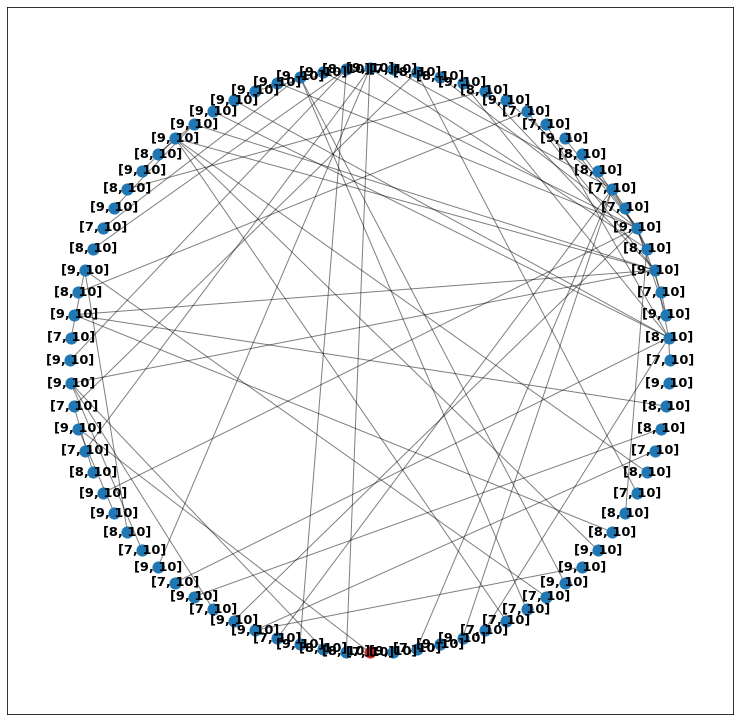

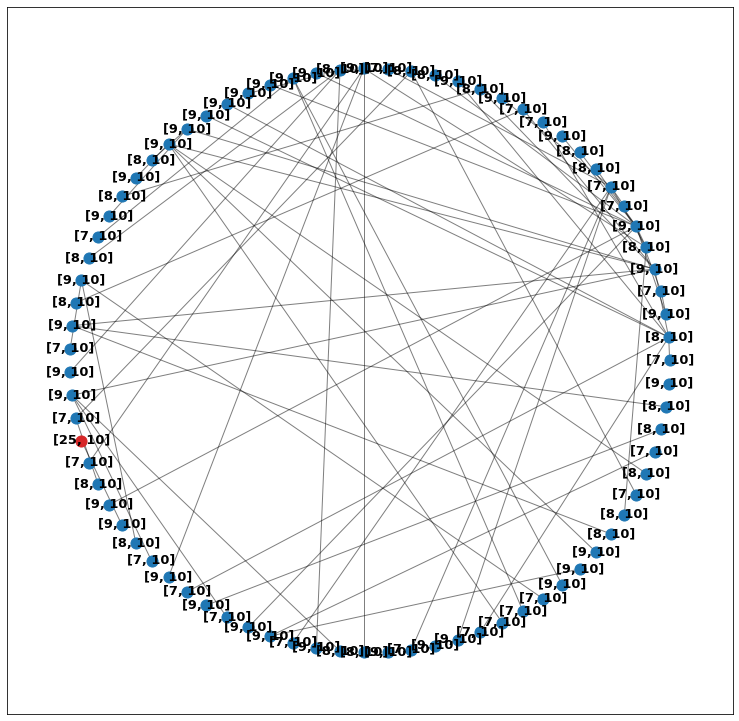

Итерация №15


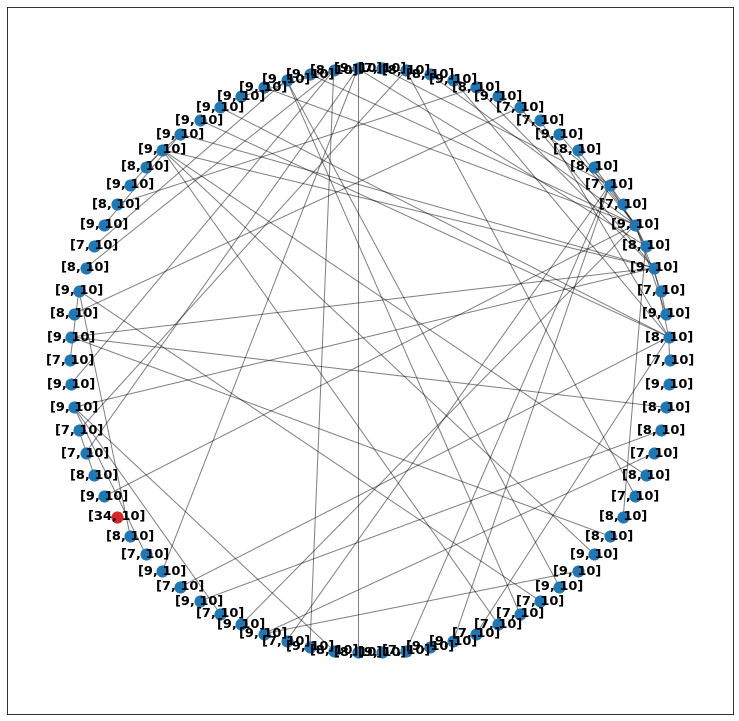

Итерация №16
Итерация №17
Итерация (время) 17
Стартовая вершина: 44 



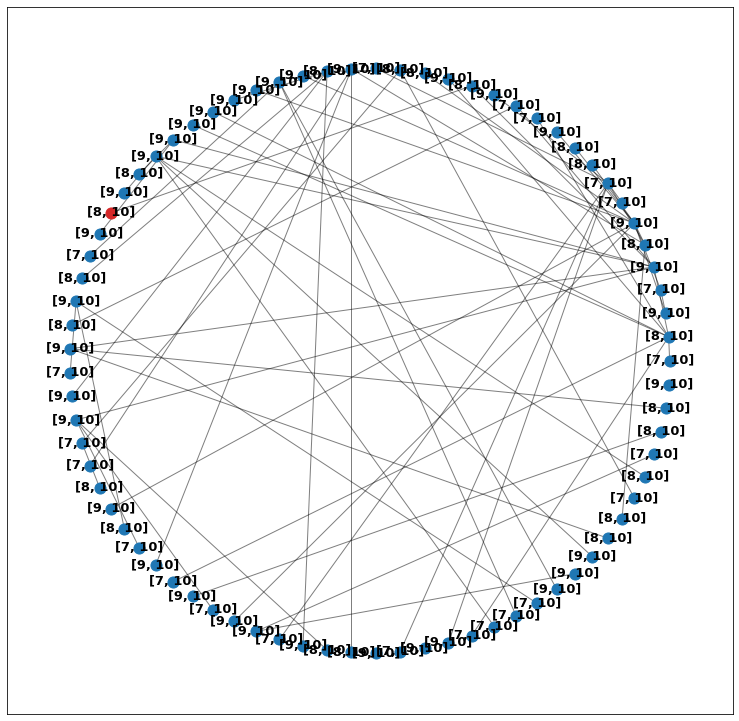

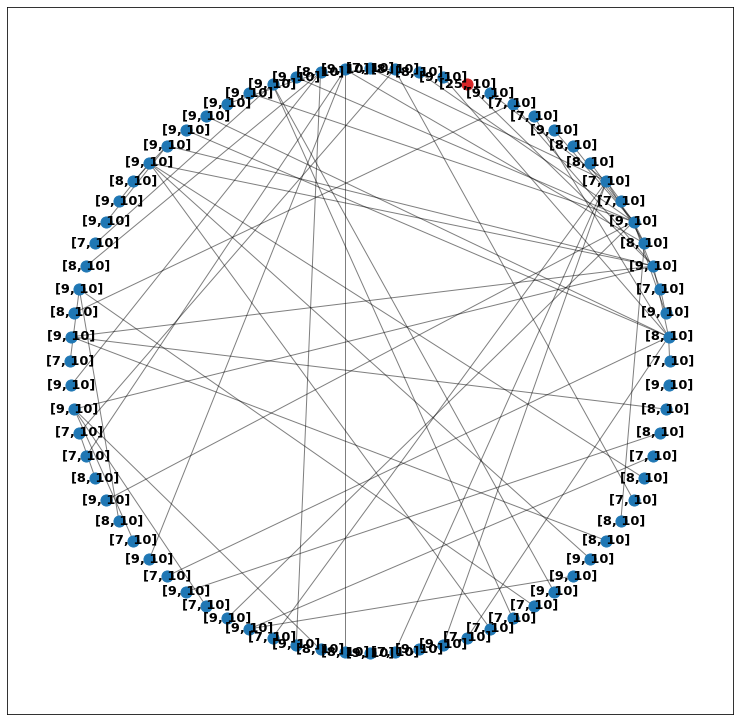

Итерация №18


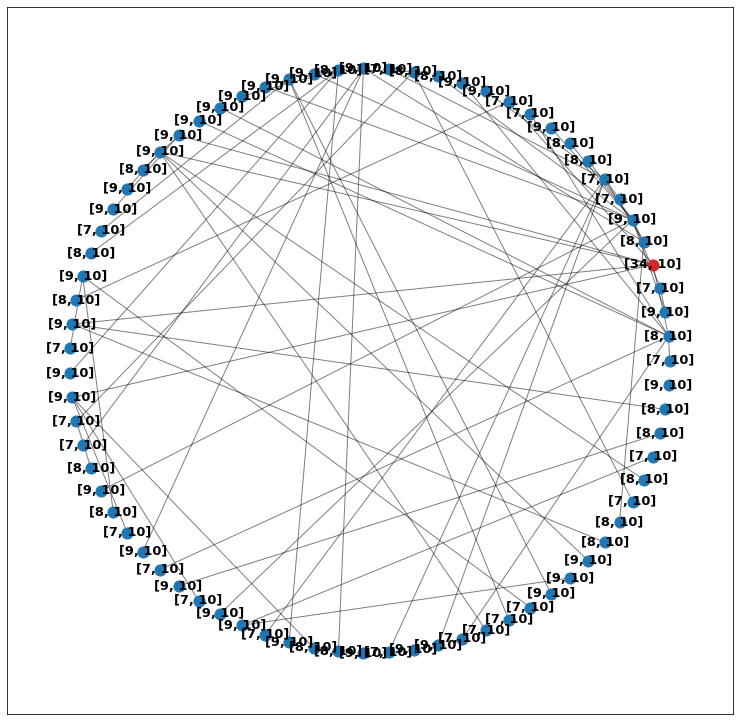

Итерация №19


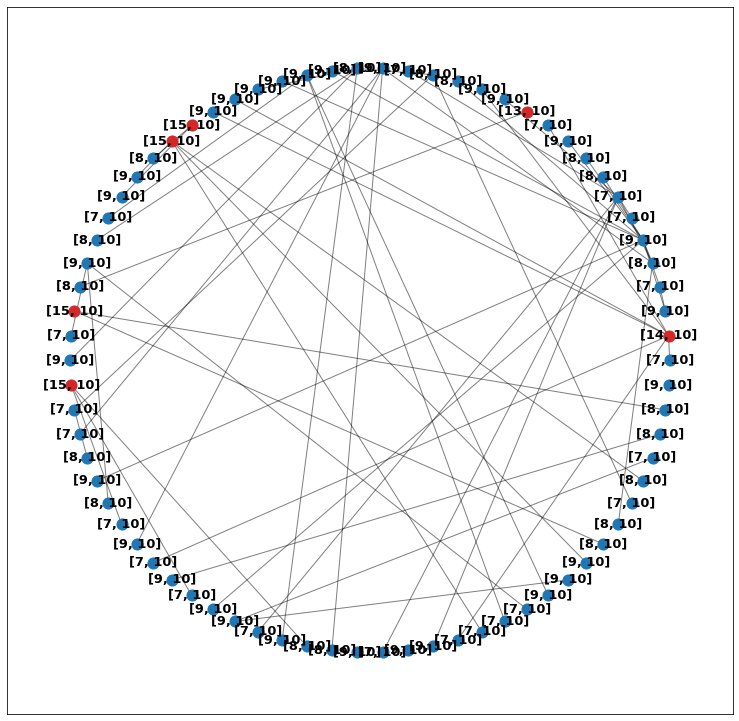

Итерация №20


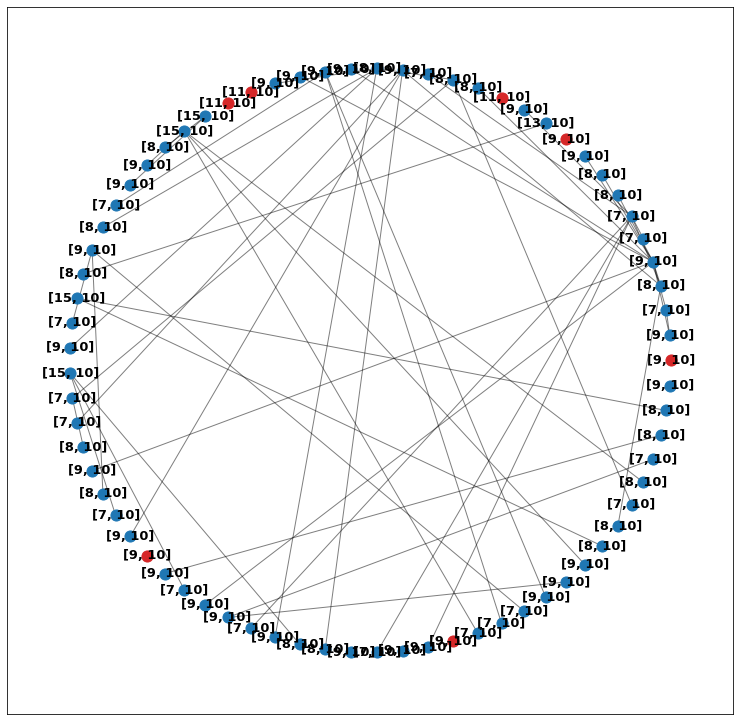

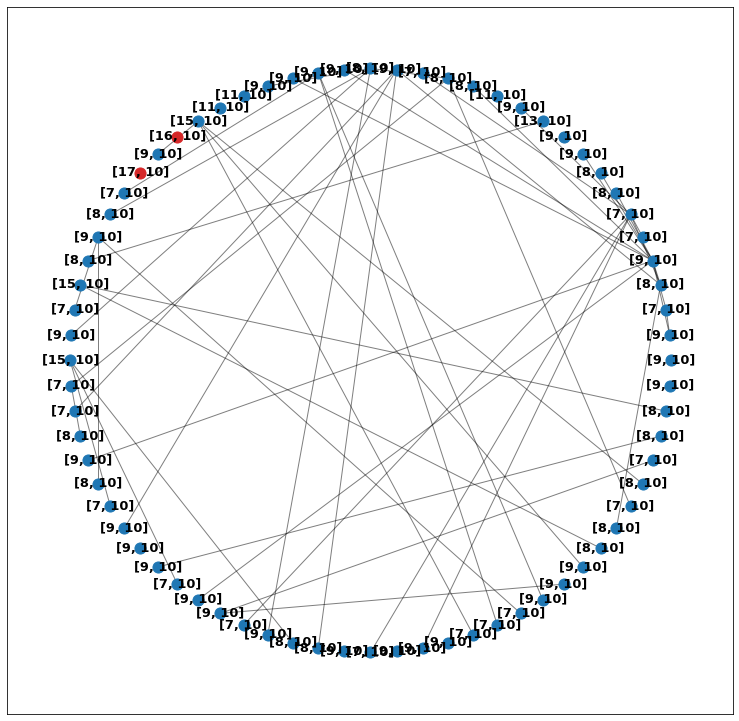

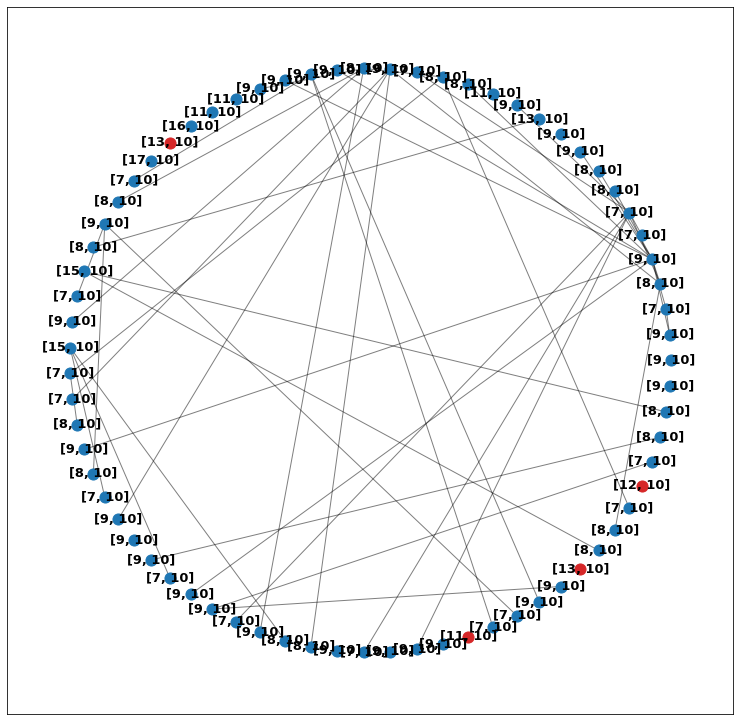

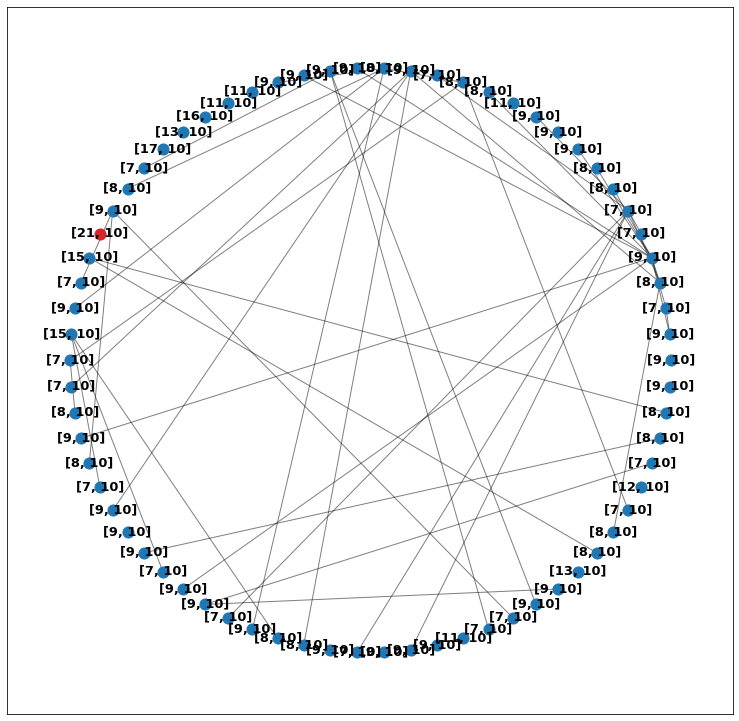

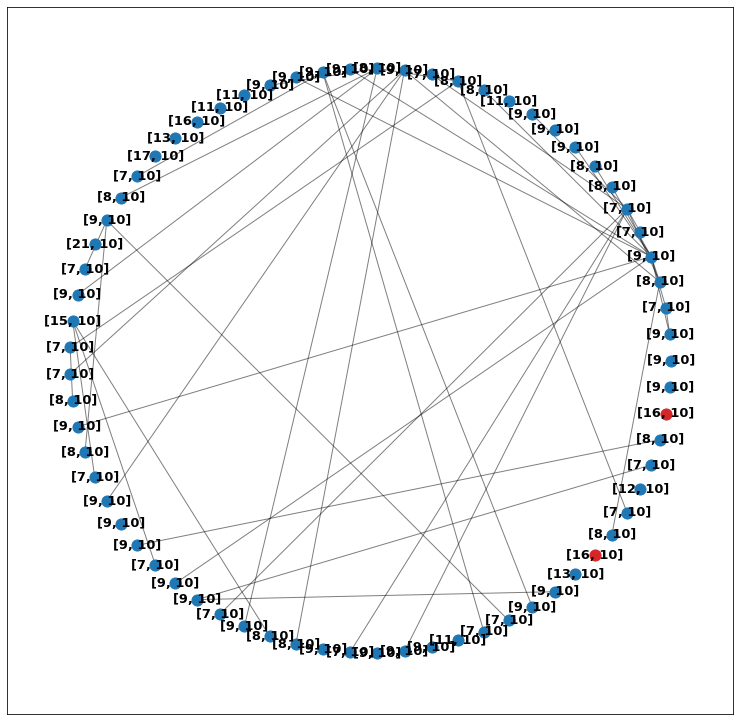

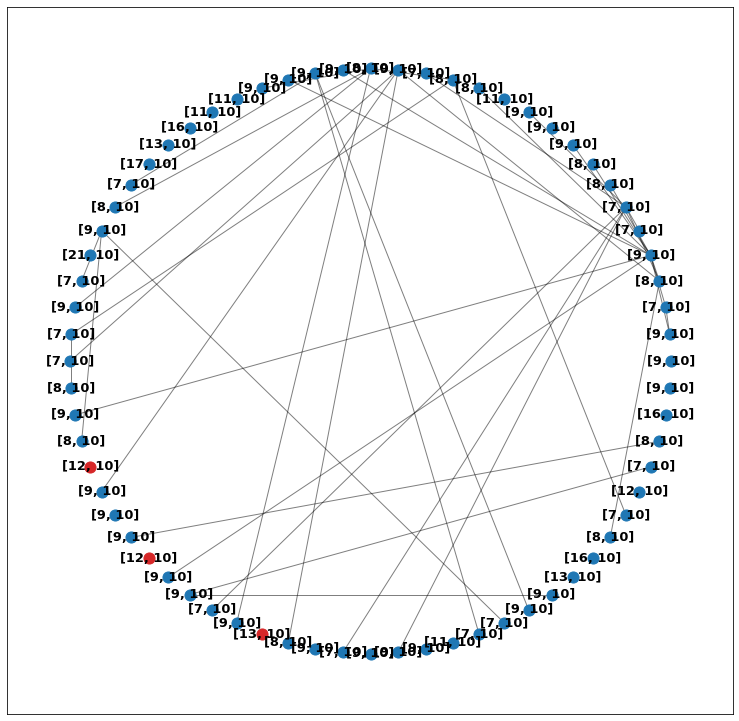

Итерация №21
Итерация №22
Итерация (время) 22
Стартовая вершина: 26 



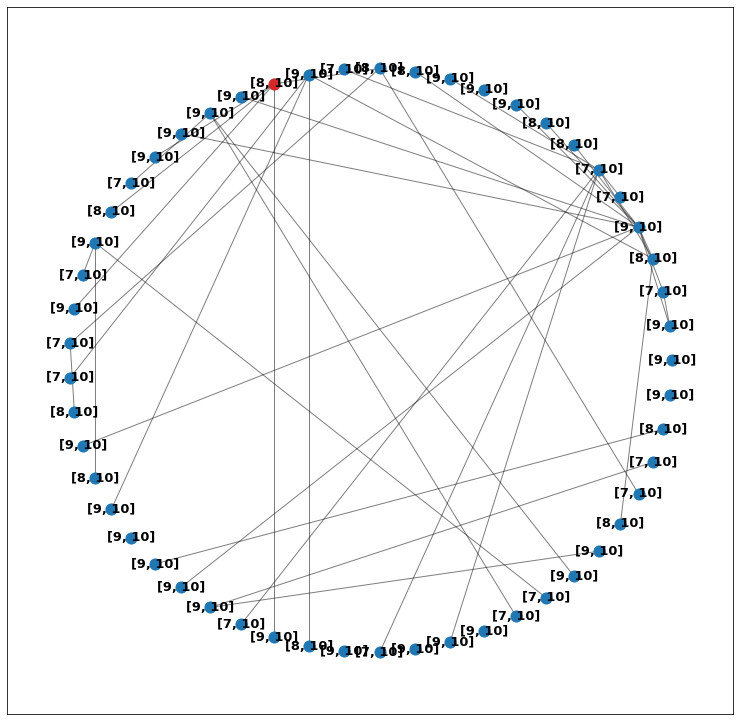

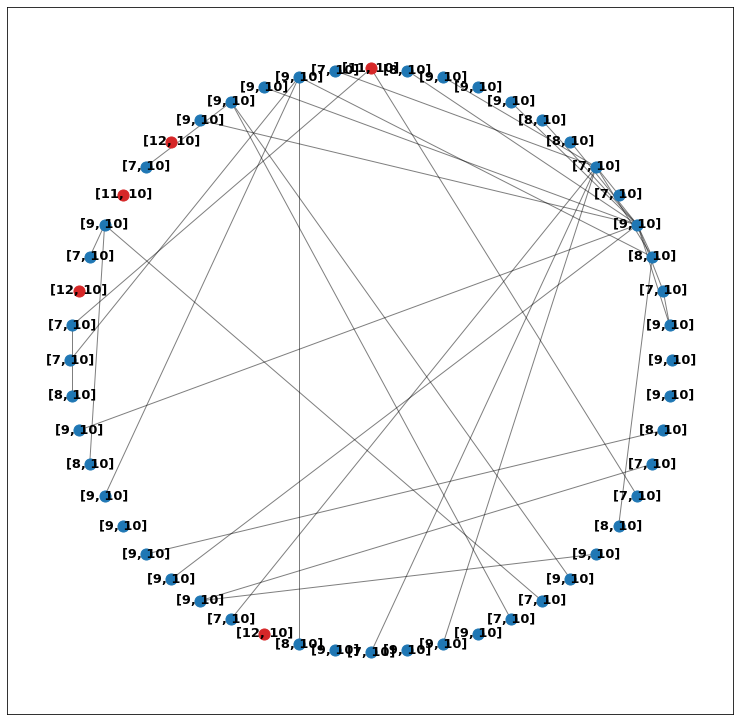

Итерация №23


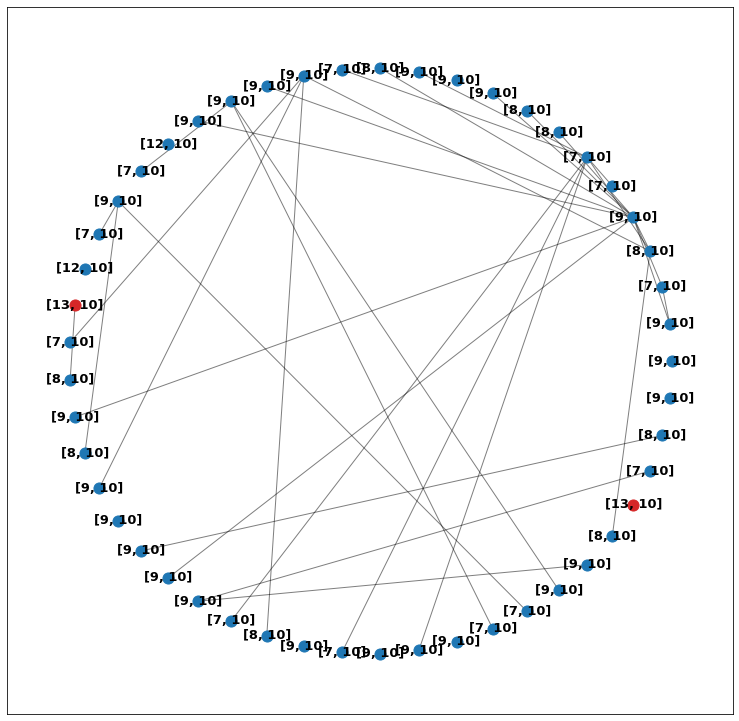

Итерация №24


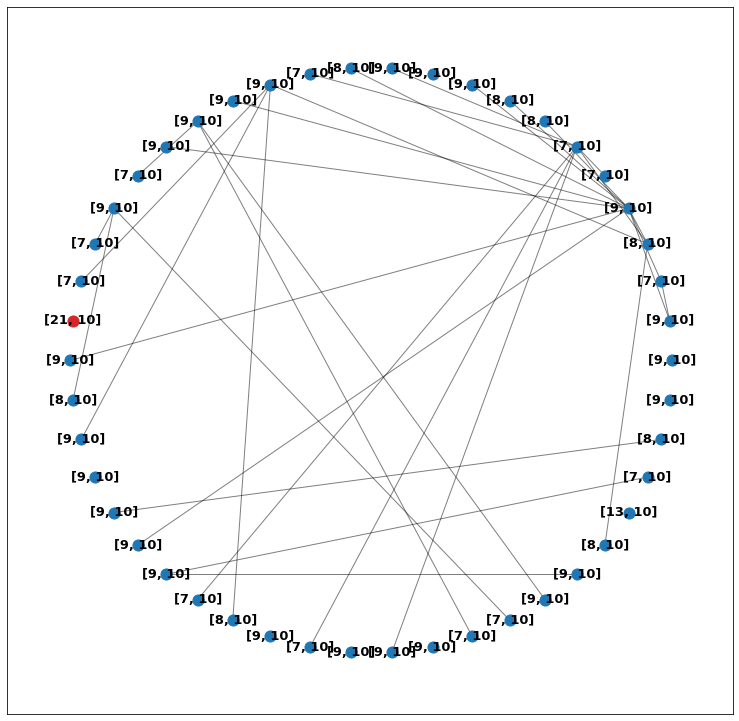

Итерация №25
Итерация №26
Итерация (время) 26
Стартовая вершина: 112 



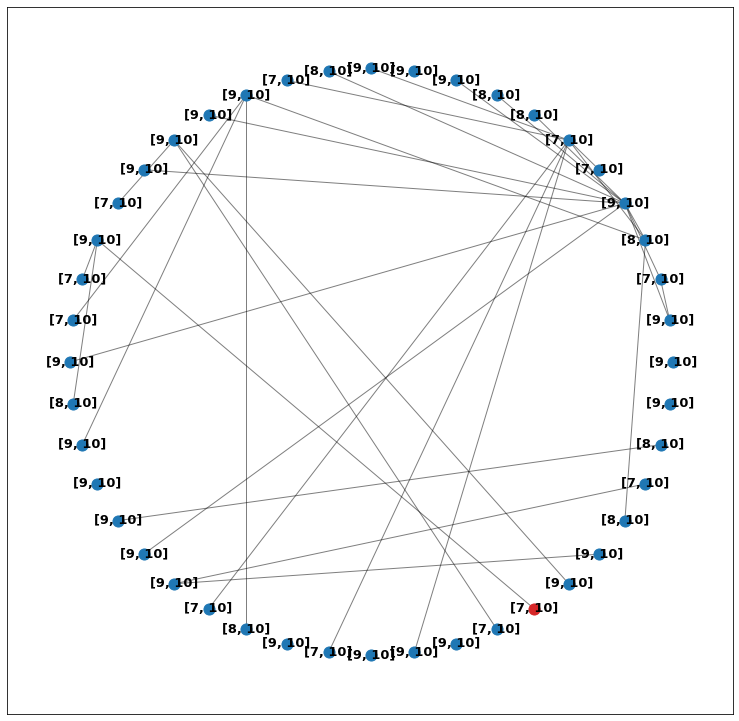

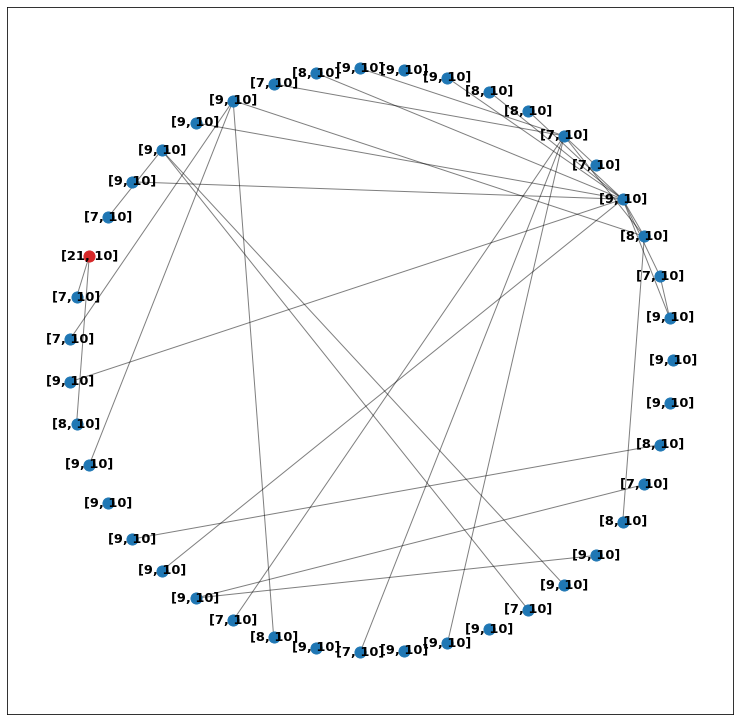

Итерация №27


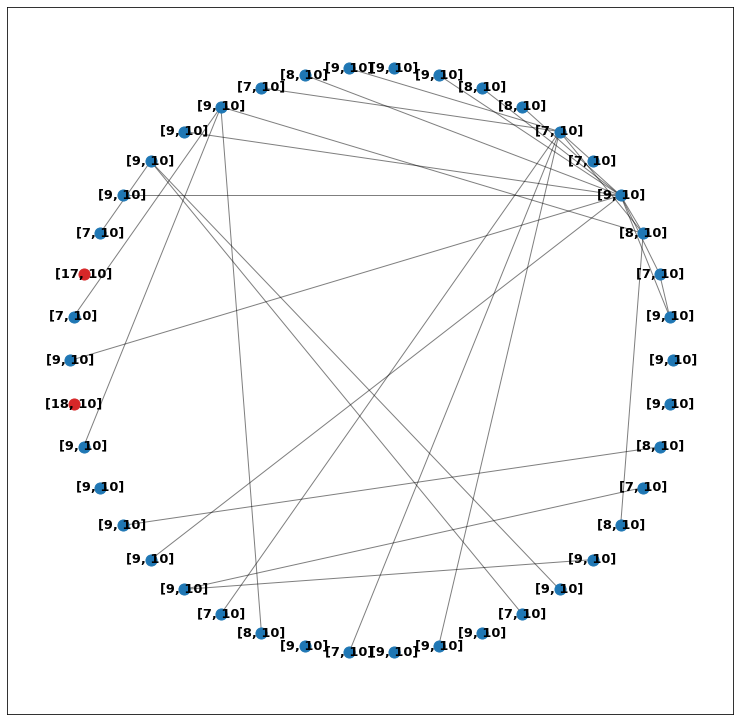

Итерация №28
Итерация №29
Итерация (время) 29
Стартовая вершина: 70 



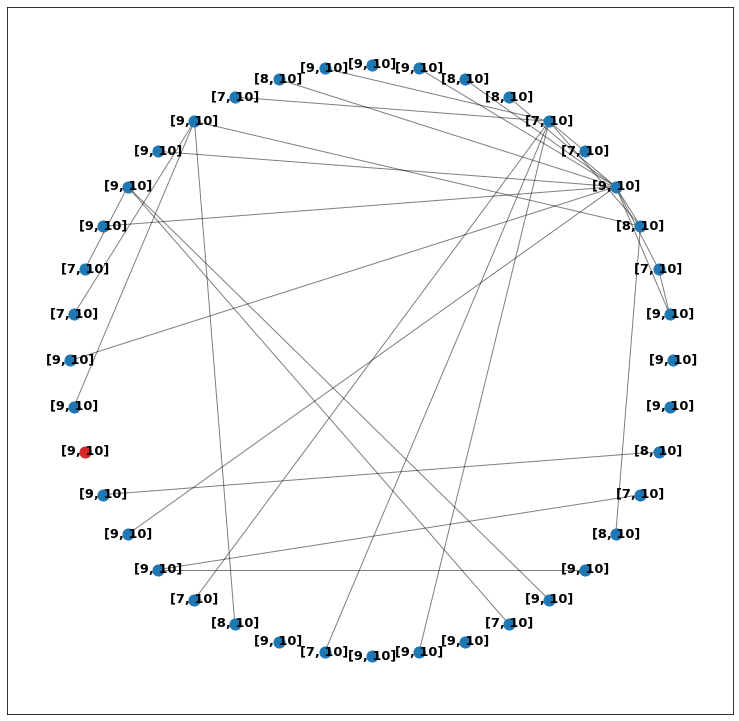

Итерация №30
Итерация (время) 30
Стартовая вершина: 46 



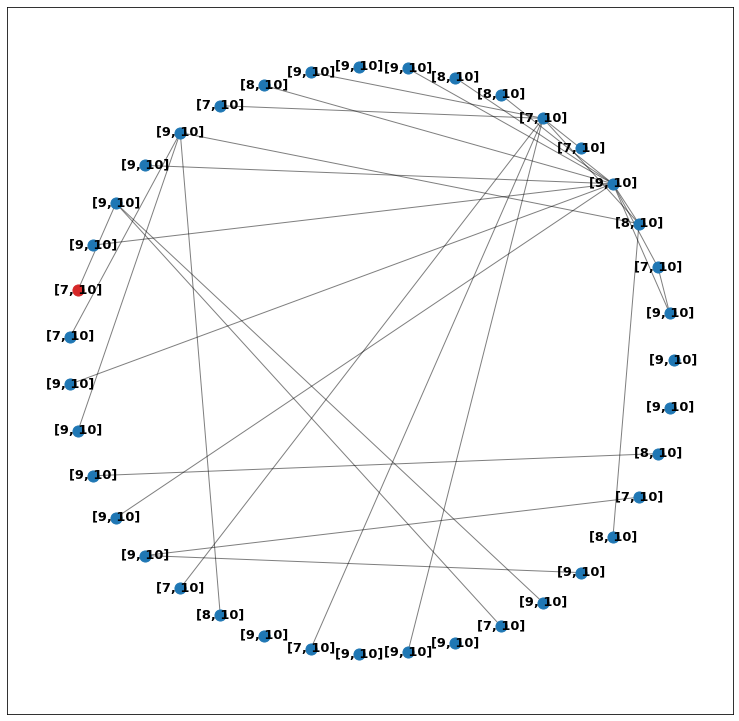

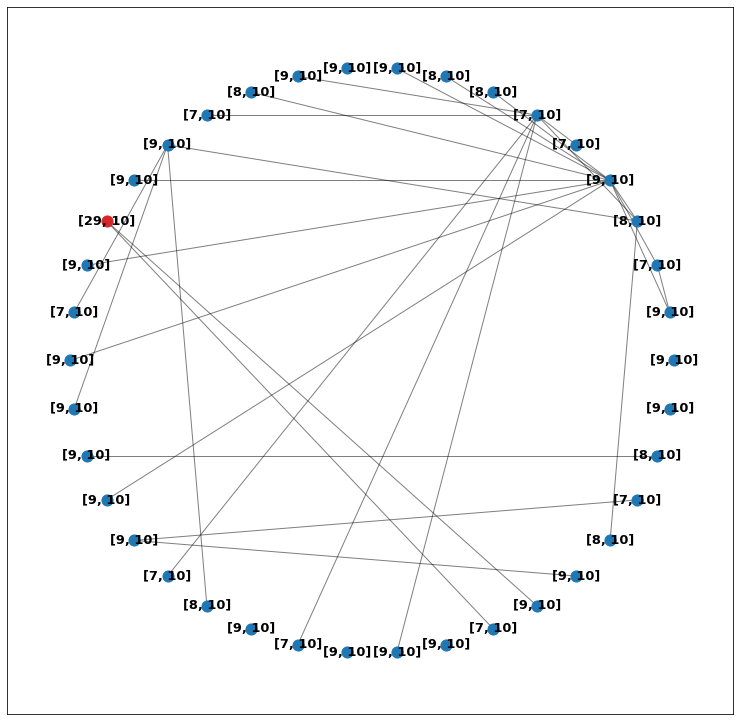

Итерация №31


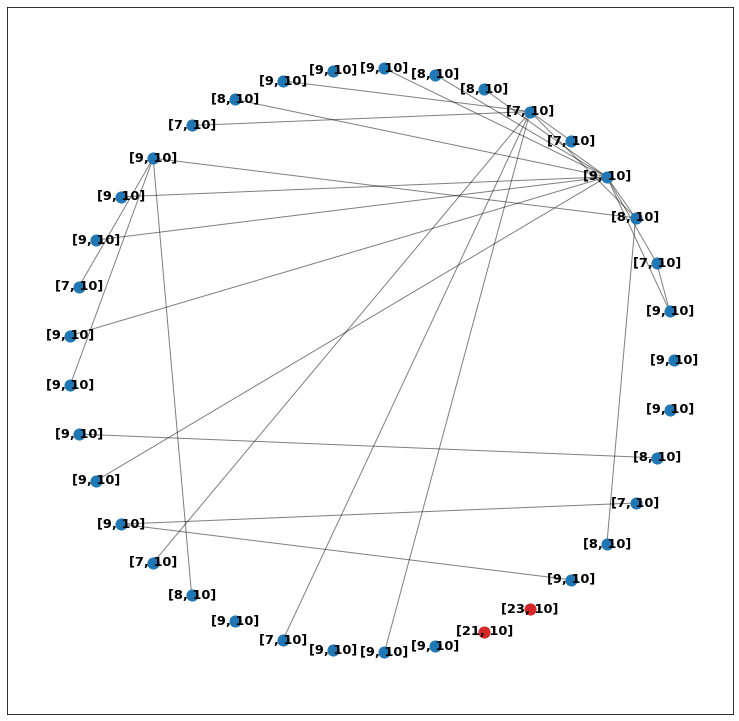

Итерация №32
Итерация №33
Итерация (время) 33
Стартовая вершина: 120 



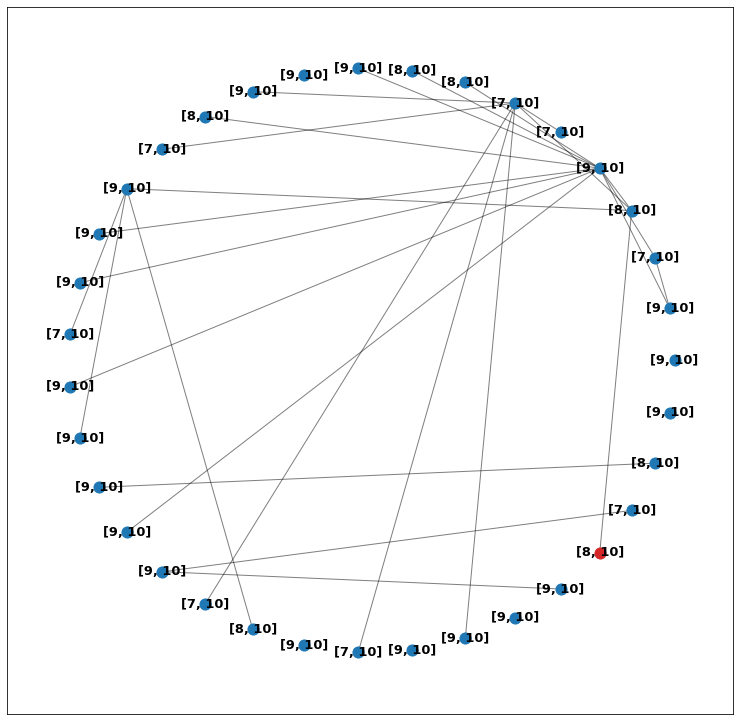

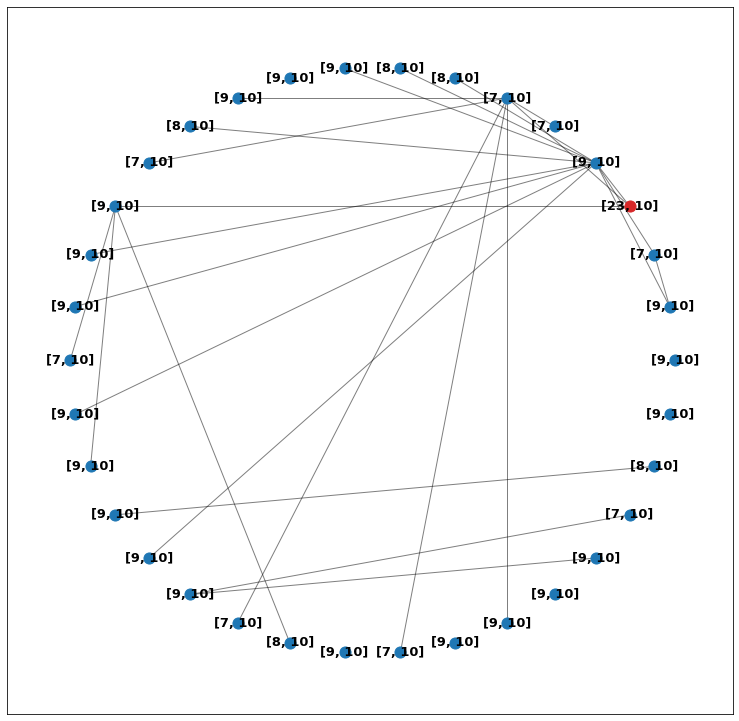

Итерация №34


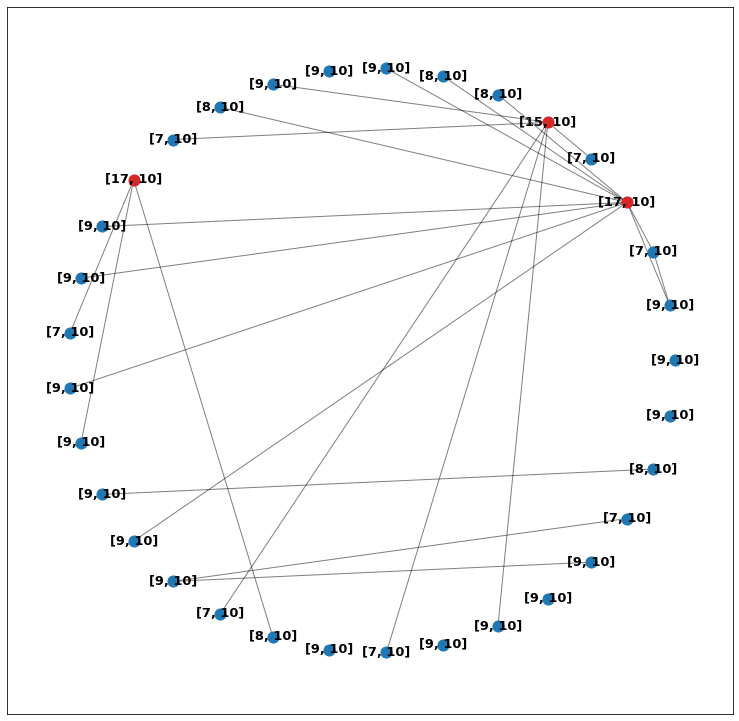

Итерация №35


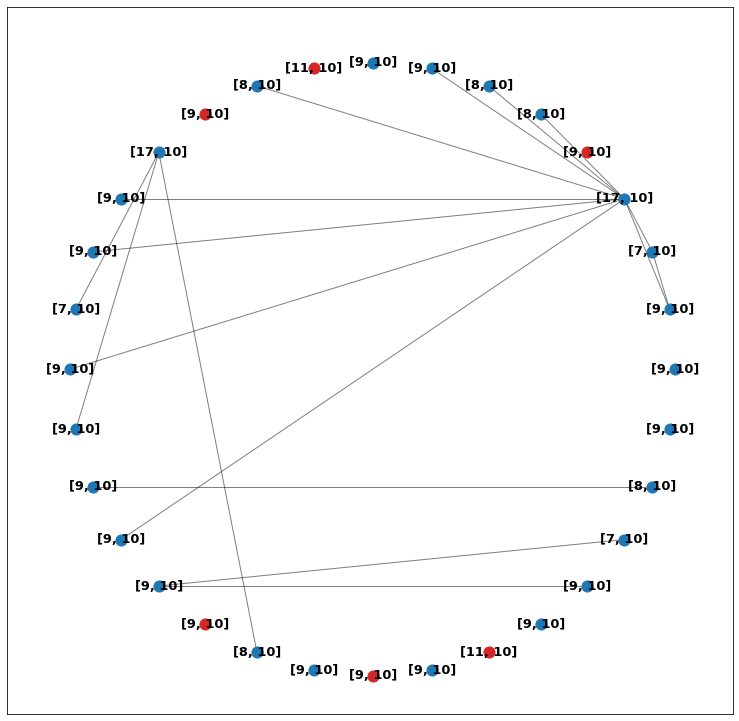

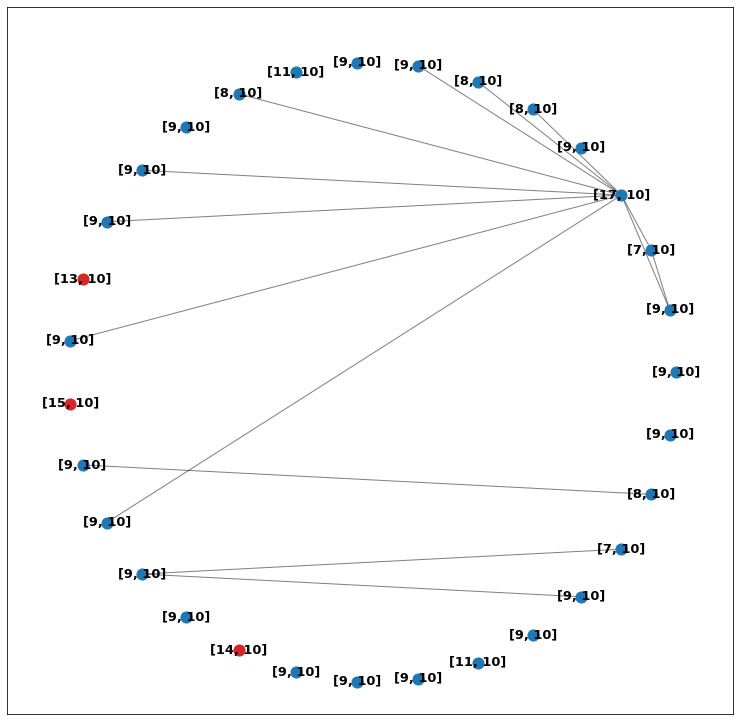

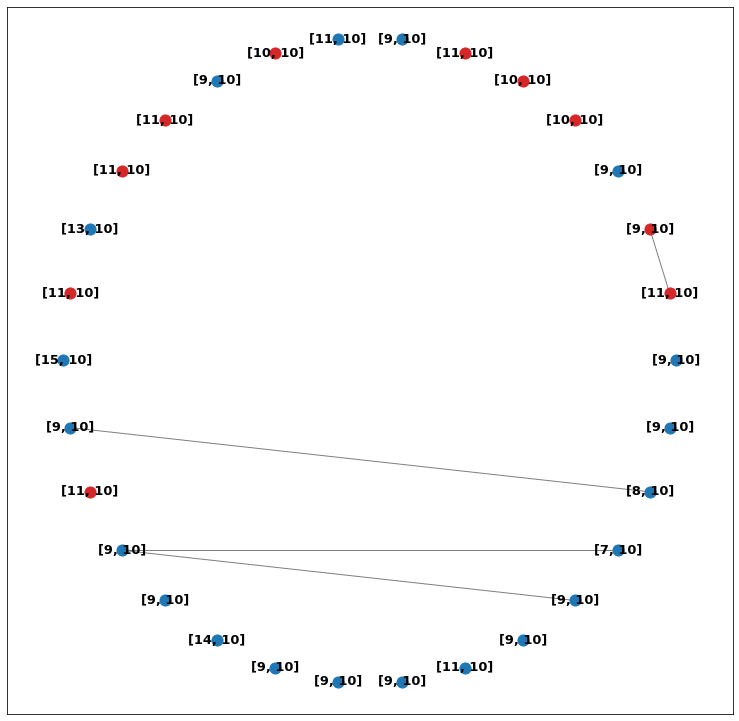

Итерация №36


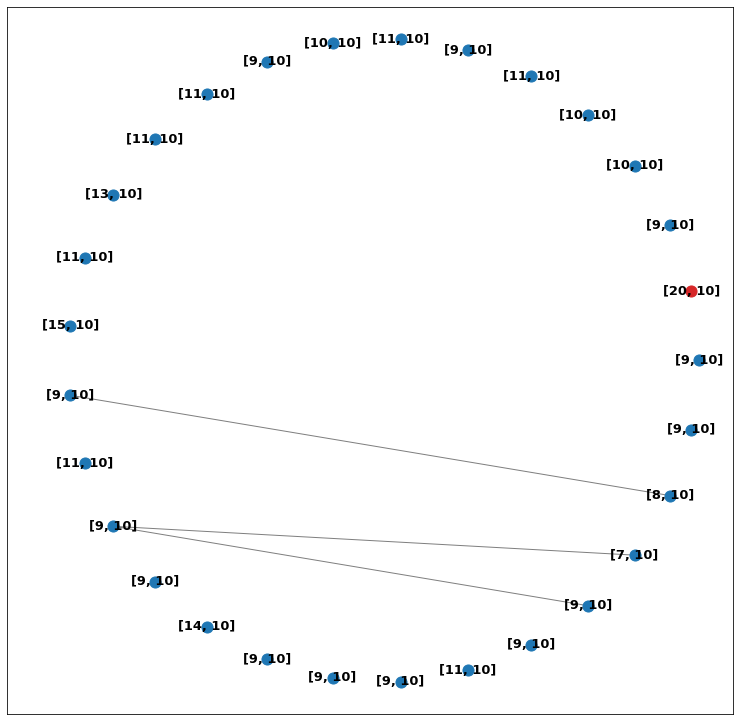

Итерация №37
Итерация №38
Итерация (время) 38
Стартовая вершина: 131 



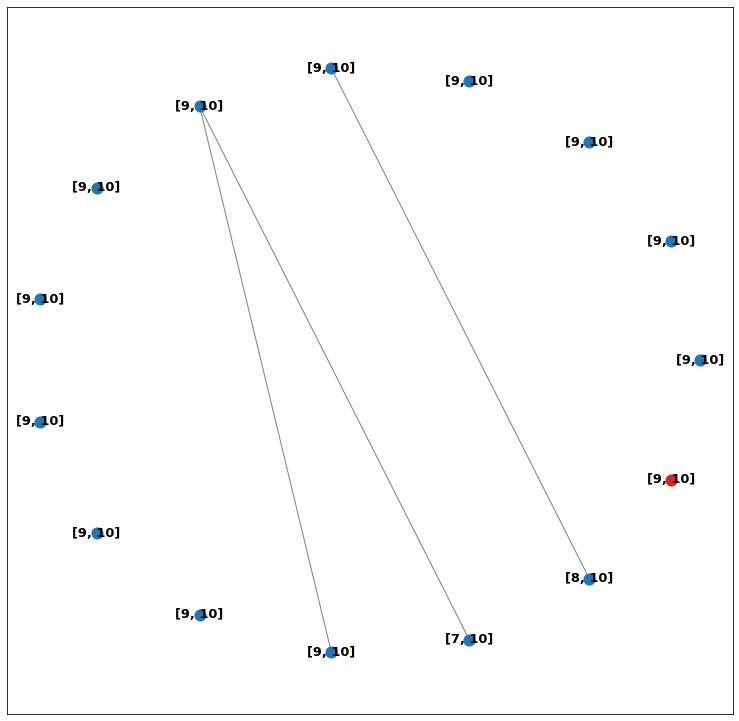

Итерация №39
Итерация (время) 39
Стартовая вершина: 127 



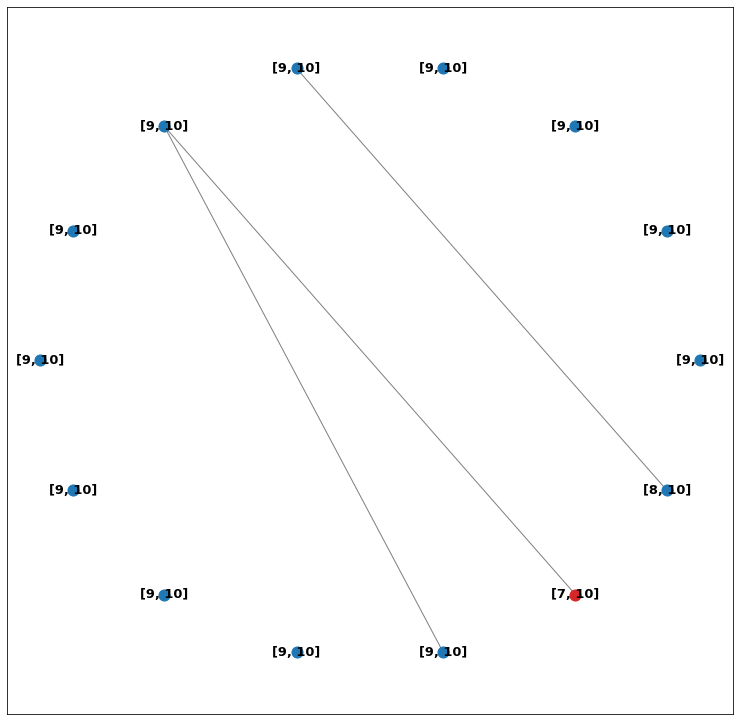

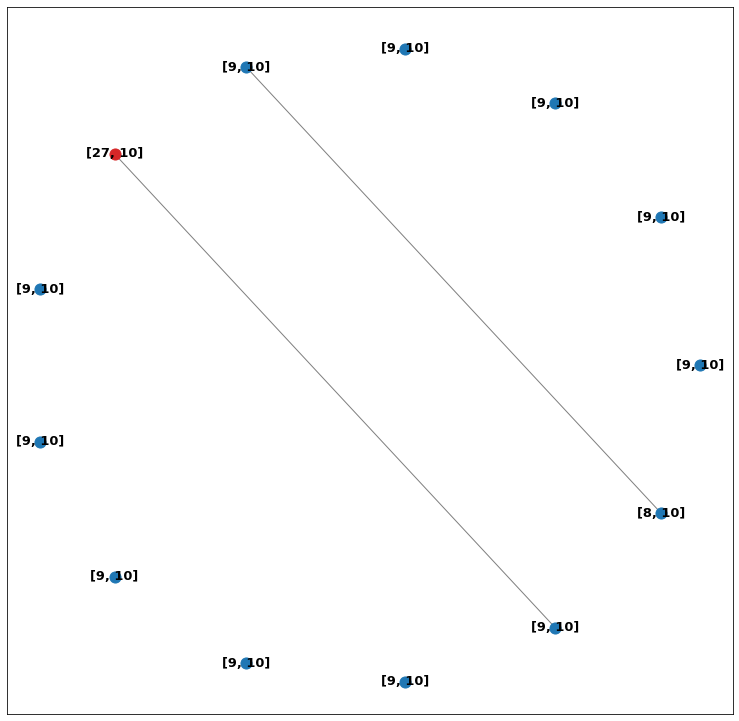

Итерация №40


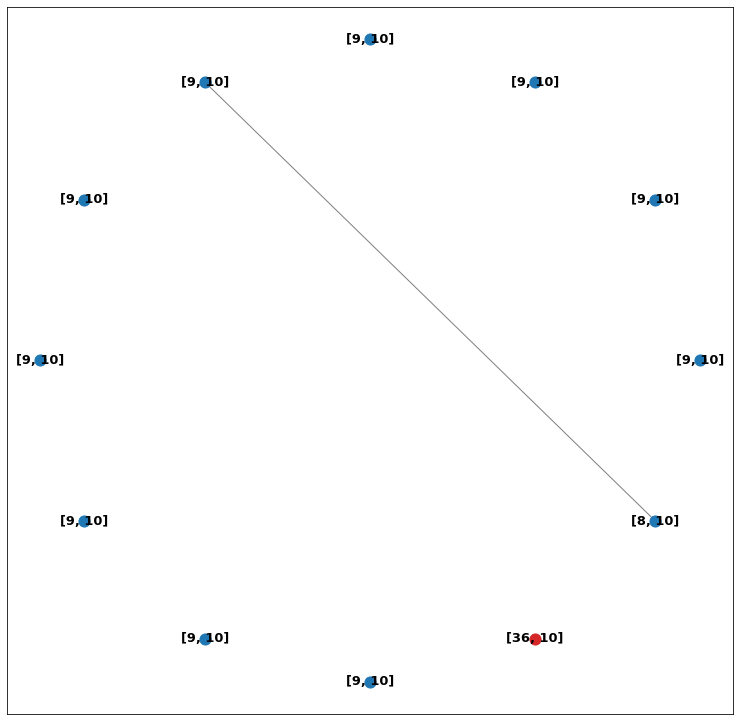

Итерация №41
Итерация №42
Итерация (время) 42
Стартовая вершина: 73 



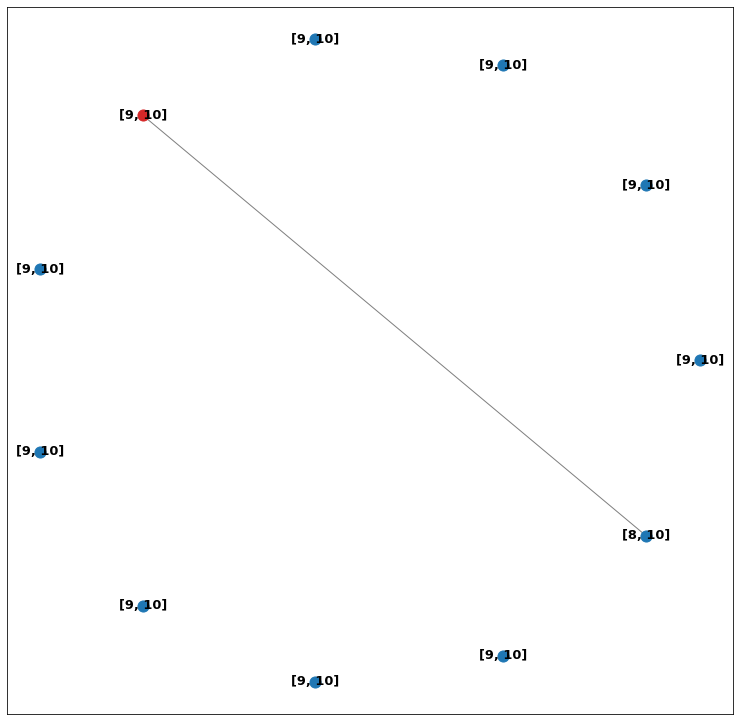

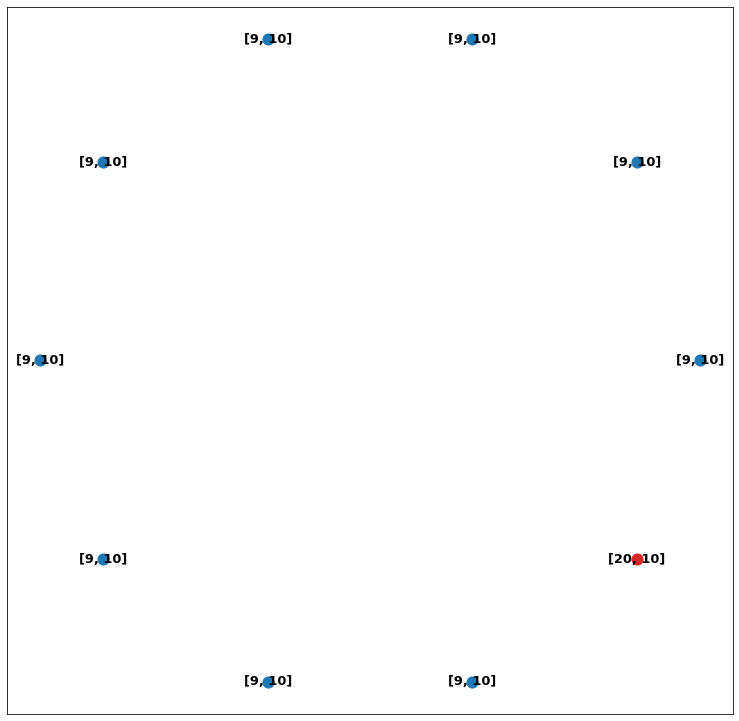

Итерация №43
Итерация №44
Итерация (время) 44
Стартовая вершина: 14 



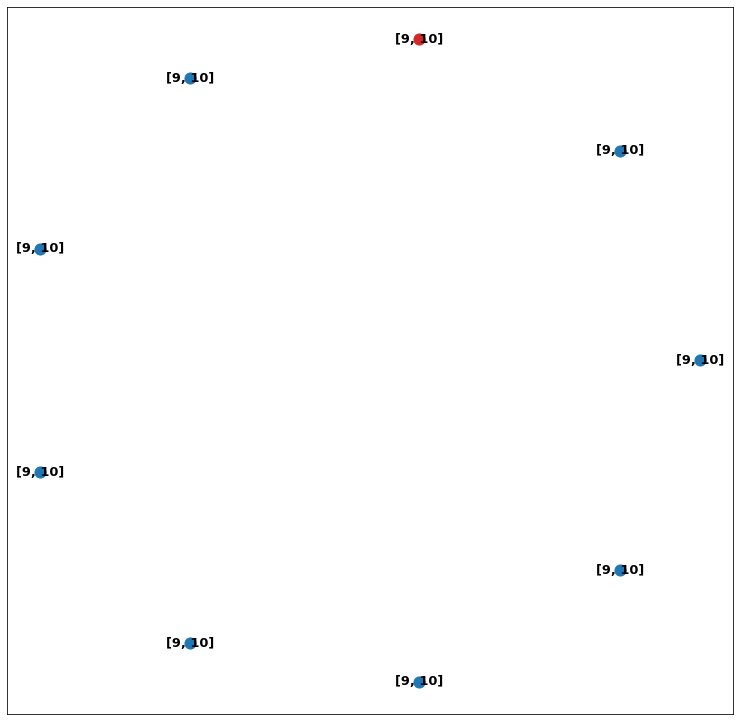

Итерация №45
Итерация (время) 45
Стартовая вершина: 96 



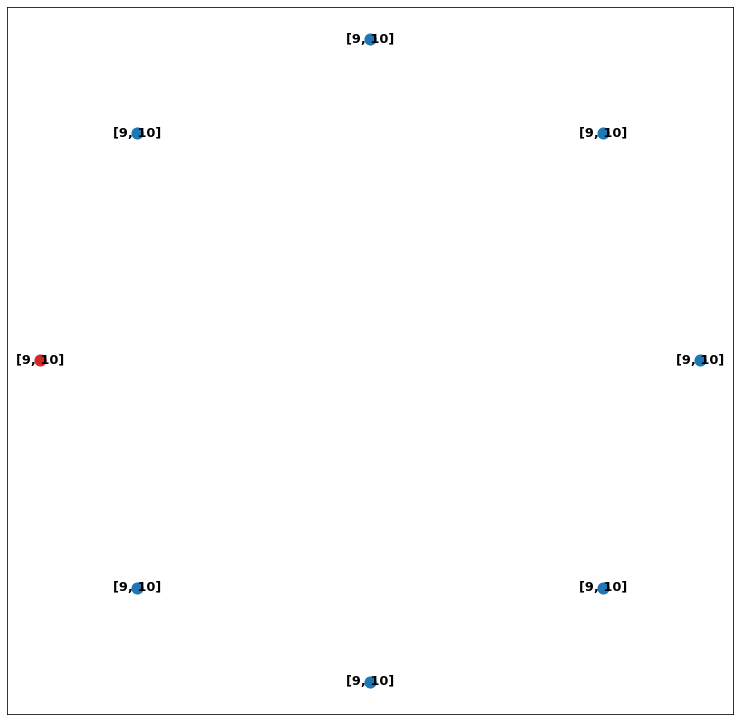

Итерация №46
Итерация (время) 46
Стартовая вершина: 106 



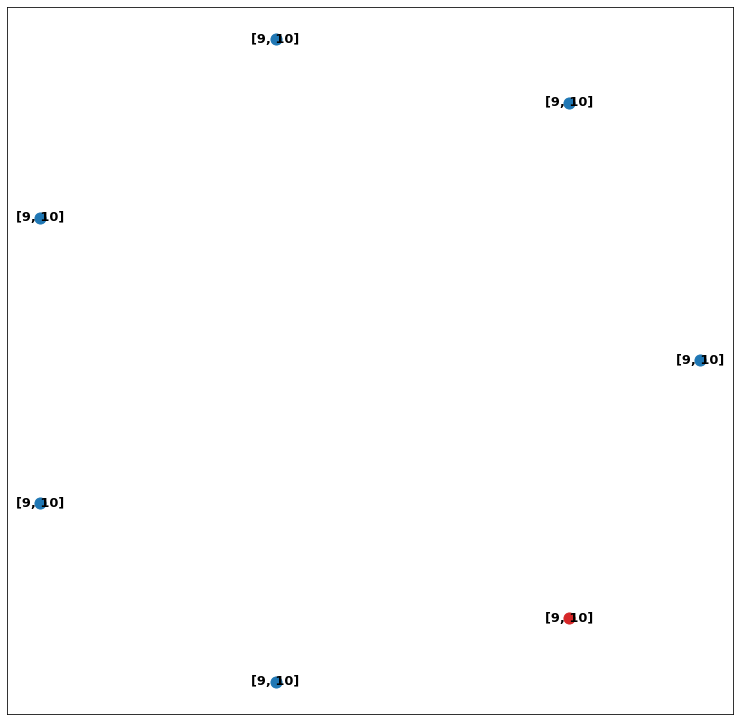

Итерация №47
Итерация (время) 47
Стартовая вершина: 82 



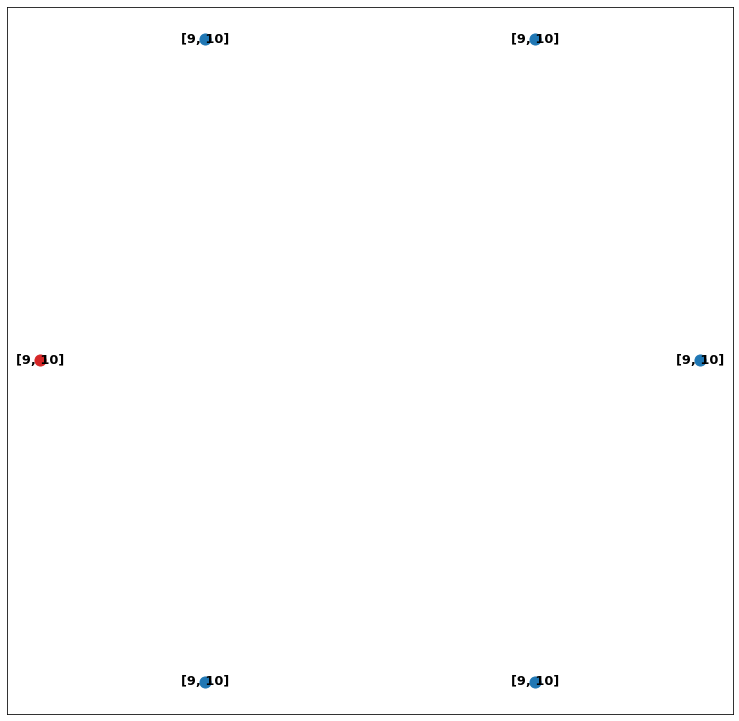

Итерация №48
Итерация (время) 48
Стартовая вершина: 24 



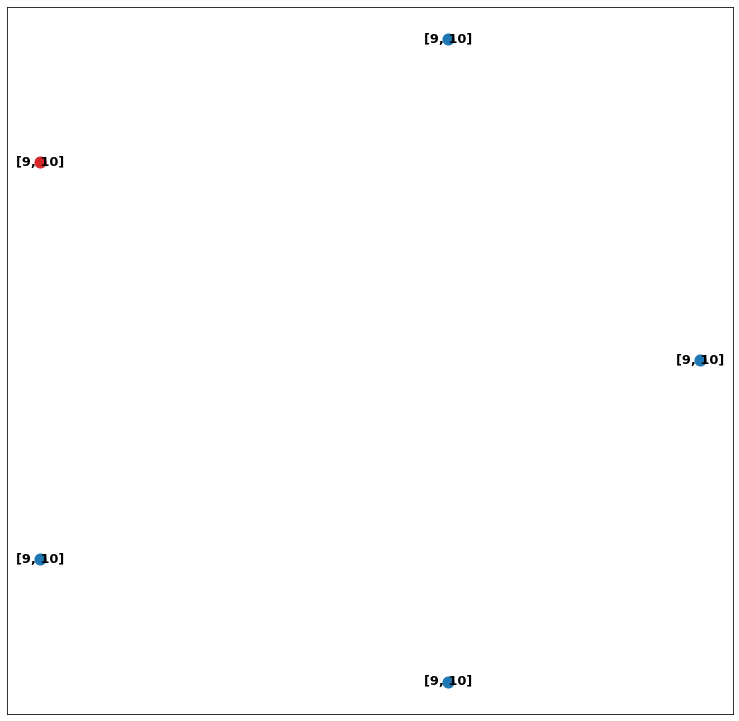

Итерация №49
Итерация (время) 49
Стартовая вершина: 102 



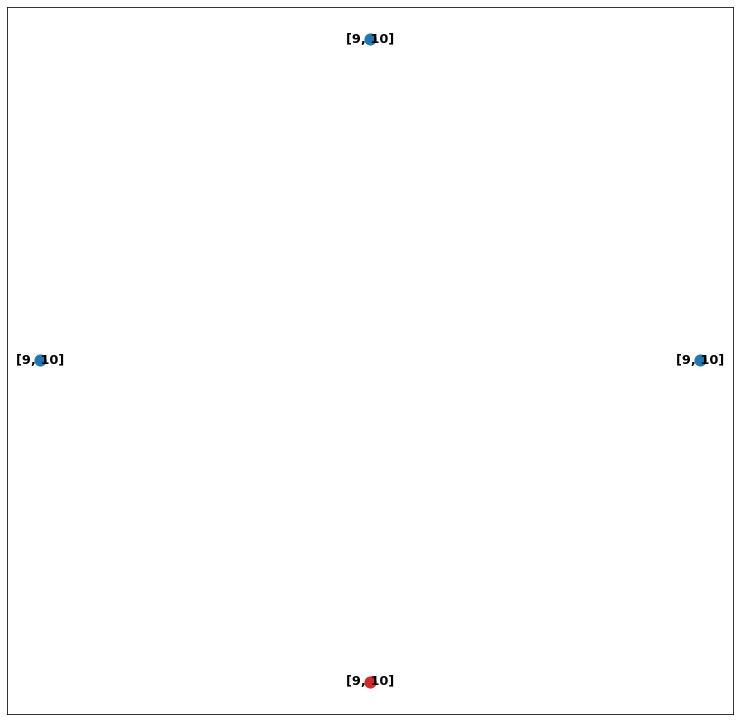

Итерация №50
Итерация (время) 50
Стартовая вершина: 8 



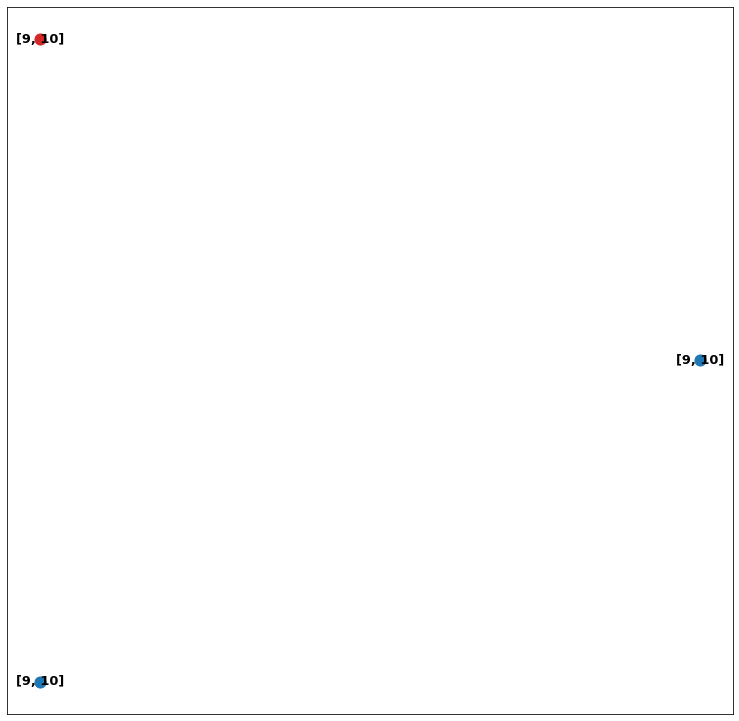

Итерация №51
Итерация (время) 51
Стартовая вершина: 98 



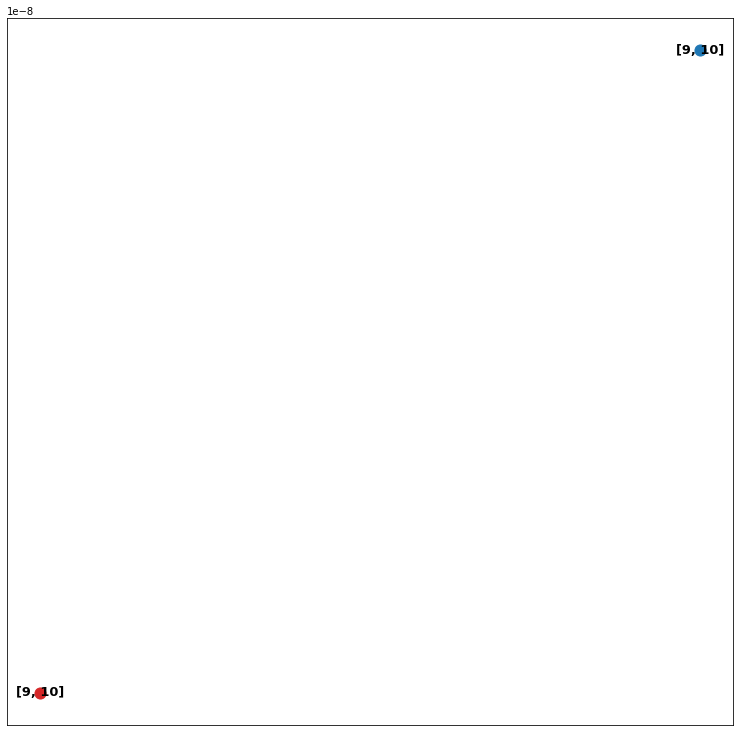

Итерация №52
Количество итераций:  52


In [ ]:
list_of_nodes = [G.number_of_nodes()]

iter_num = 1
while G.number_of_nodes() > 1:
    print(f'Итерация (время) {iter_num}')
    start_node = int(random.choice(list(G.nodes)))
    print(f'Стартовая вершина: {start_node} \n')
    f.draw_graph([start_node], 'red', 'blue')

    labels[start_node][0] = random.randint(labels[start_node][1],20)

    vertexes_to_add_additional_load_to = f.added_loads(start_node)
    
    list_of_nodes.append(G.number_of_nodes())
    
    for _ in range(2, 50):
        iter_num += 1
        print(f'Итерация №{iter_num}')
        new_overloaded_nodes = f.check_graph(vertexes_to_add_additional_load_to, labels)
        new_overloaded_nodes = list(set(new_overloaded_nodes))
        if not new_overloaded_nodes:
            donee = 1
            break
        vertexes_to_add_additional_load_to = []
        for node in list(new_overloaded_nodes):
            res = f.added_loads(node)
            if res != 55:
                vertexes_to_add_additional_load_to += res
        list_of_nodes.append(G.number_of_nodes())

            
print('Количество итераций: ', iter_num)

In [ ]:
y2 = list_of_nodes
n = 0
for i in range (len(y2)):
    n += 1
    print(f'Количество вершин: {y2[i]} Итерация (время): {n}')

Количество вершин: 133 Итерация (время): 1
Количество вершин: 132 Итерация (время): 2
Количество вершин: 128 Итерация (время): 3
Количество вершин: 123 Итерация (время): 4
Количество вершин: 117 Итерация (время): 5
Количество вершин: 107 Итерация (время): 6
Количество вершин: 106 Итерация (время): 7
Количество вершин: 105 Итерация (время): 8
Количество вершин: 104 Итерация (время): 9
Количество вершин: 98 Итерация (время): 10
Количество вершин: 86 Итерация (время): 11
Количество вершин: 85 Итерация (время): 12
Количество вершин: 82 Итерация (время): 13
Количество вершин: 80 Итерация (время): 14
Количество вершин: 79 Итерация (время): 15
Количество вершин: 78 Итерация (время): 16
Количество вершин: 77 Итерация (время): 17
Количество вершин: 76 Итерация (время): 18
Количество вершин: 75 Итерация (время): 19
Количество вершин: 74 Итерация (время): 20
Количество вершин: 68 Итерация (время): 21
Количество вершин: 53 Итерация (время): 22
Количество вершин: 52 Итерация (время): 23
Количество 